In [ ]:
#importing necessary lib
import pandas as pd
import numpy as np
import pickle 
import warnings
warnings.filterwarnings("ignore")

In [ ]:
import os
print('CWD is ',os.getcwd())

CWD is  C:\Users\Sabarish\Downloads\aptos2019-blindness-detection


In [ ]:
from tqdm import tqdm_notebook,tqdm
from prettytable import PrettyTable

In [ ]:
%pip install prettytable


The following command must be run outside of the IPython shell:

    $ pip install prettytable

The Python package manager (pip) can only be used from outside of IPython.
Please reissue the `pip` command in a separate terminal or command prompt.

See the Python documentation for more information on how to install packages:

    https://docs.python.org/3/installing/


In [ ]:
#vision libraries import
import seaborn as sns
import matplotlib.pyplot as plot

In [ ]:
from sklearn.manifold import TSNE

In [ ]:
%matplotlib inline
plot.rcParams["axes.grid"]=False

In [ ]:
#image libraries
from PIL import Image
import cv2

In [ ]:
#Deep learning
from tensorflow.python.keras import backend as k
from keras import *
from keras.preprocessing.image import *
from keras.layers import *
from keras.callbacks import *


In [ ]:
#Deep learning
from tensorflow.python.keras import backend as k
from keras import *
from keras.preprocessing.image import *
from keras.layers import *
from keras.callbacks import *


Using TensorFlow backend.


In [ ]:
![alt text](000c1434d8d7.png "Title")

'[alt' is not recognized as an internal or external command,
operable program or batch file.


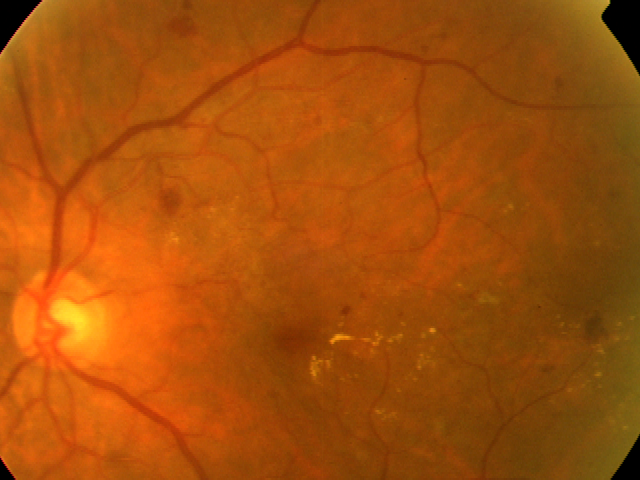

In [ ]:
from IPython.display import Image
Image(filename='0a0780ad3395.png')

In [ ]:
#now we need to read data from test and train dir

def load_data_dir():
    train=pd.read_csv('train.csv')
    test=pd.read_csv('test.csv')
    
    test_dir=os.path.join('./','test_images/')
    train_dir=os.path.join('./','train_images/')
    train['file_path']=train['id_code'].map(lambda x:os.path.join(train_dir,'{}.png'.format(x)))
    test['file_path']=test['id_code'].map(lambda x:os.path.join(test_dir,'{}.png'.format(x)))
    
    train['file_name']=train['id_code'].apply(lambda x: x+ ".png")
    test['file_name']=test['id_code'].apply(lambda x: x+ ".png")
    train['diagnosis']= train['diagnosis'].astype(str)
    
    return train,test 
    

In [ ]:
df_train,df_test=load_data_dir()
print(df_train.shape,df_test.shape)

(3662, 4) (1928, 3)


In [ ]:
df_train.head(20)

,id_code,diagnosis,file_path,file_name
0,000c1434d8d7,2,./train_images/000c1434d8d7.png,000c1434d8d7.png
1,001639a390f0,4,./train_images/001639a390f0.png,001639a390f0.png
2,0024cdab0c1e,1,./train_images/0024cdab0c1e.png,0024cdab0c1e.png
3,002c21358ce6,0,./train_images/002c21358ce6.png,002c21358ce6.png
4,005b95c28852,0,./train_images/005b95c28852.png,005b95c28852.png
5,0083ee8054ee,4,./train_images/0083ee8054ee.png,0083ee8054ee.png
6,0097f532ac9f,0,./train_images/0097f532ac9f.png,0097f532ac9f.png
7,00a8624548a9,2,./train_images/00a8624548a9.png,00a8624548a9.png
8,00b74780d31d,2,./train_images/00b74780d31d.png,00b74780d31d.png
9,00cb6555d108,1,./train_images/00cb6555d108.png,00cb6555d108.png


In [ ]:
#Now lets visualize and see about the classes provided

def visualize_classes(df):
    df_group=pd.DataFrame(df.groupby('diagnosis').agg('size').reset_index())
    df_group.columns=['diagnosis','count']
    sns.set(rc={'figure.figsize':(20,10)},style='ticks')
    sns.barplot(x='diagnosis',y='count',data=df_group,palette="Greens_d")
    plot.title('CLASS DISTRIBUTION')
    plot.show()


In [ ]:
visualize_classes(df_train)

C:\Users\Sabarish\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  """


ValueError: style must be one of white, dark, whitegrid, darkgrid, ticks

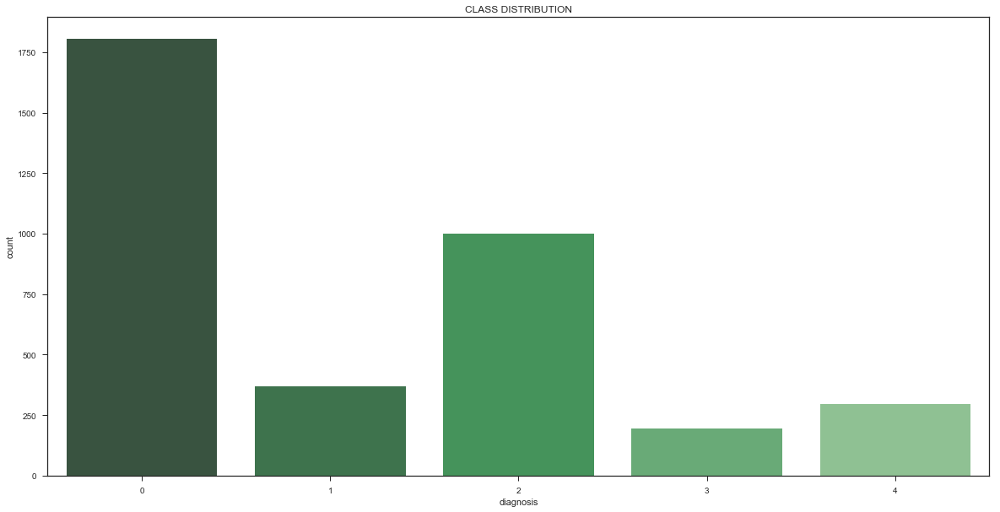

In [ ]:
visualize_classes(df_train)

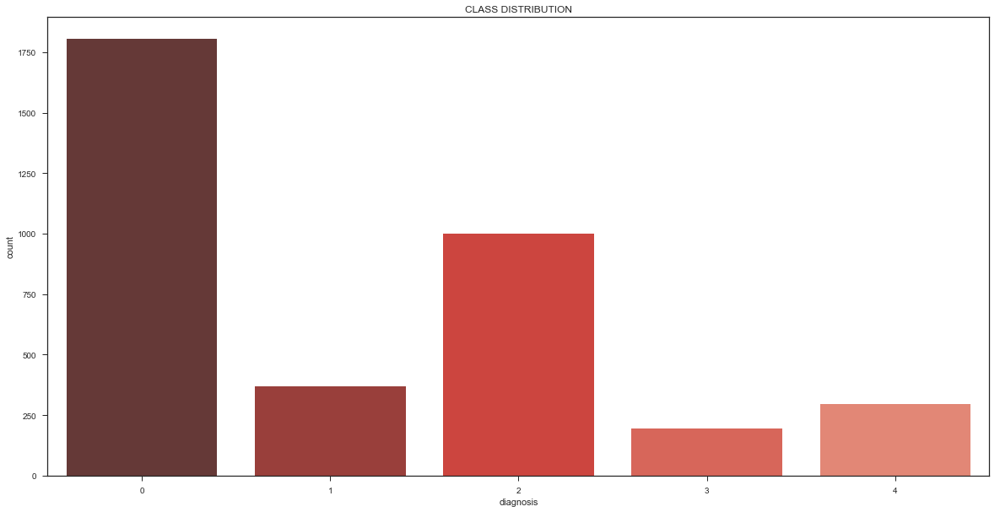

In [ ]:
visualize_classes(df_train)

From the plotted distribution chart we can observe that 
class-0 -1750 images [NO DR]
class-1 -375 images  [MILD]
class-2 -1000 images [MODERATE]
class-3 -200 images  [SEVERE]
class-4 -270 images  [PROLIFERATIVE DR]


From this plot we can infer that to there are imabalances in dataset and to overcome that we must use image augmentation  

In [ ]:
#RGB to Grey color conversion processing
Size_of_image=200
def grey(image):
    image= cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    image= cv2.resize(image,(Size_of_image,Size_of_image))
    return image

In [ ]:
def showImages(df,classes,color_value):
    df=df.groupby('diagnosis',group_keys=False).apply(lambda df:df.sample(classes))
    df= df.reset_index(drop=True)
    
    plot.rcParams["axes.grid"]=False
    for i in range(classes):
        x,y=plot.subplots(1,5,figsize= (15,15))
        y[0].set_ylabel("Data Points")
        
        df_arr=df[df.index.isin([i+(classes*0),i+(classes*1),i+(classes*2),i+(classes*3),i+(classes*4)])]
        
        for j in range(5):
            if color_value == 'gray':
                image=grey(cv2.imread(df_arr.file_path.iloc[j]))
                y[j].imshow(image,cmap=color_value)
            else:
                y[j].imshow(Image.open(df_arr.file_path.iloc[j]).resize((Size_of_image,Size_of_image)))
            y[j].set_xlabel('LEVEL '+str(df_arr.diagnosis.iloc[j]))
        
        plot.show()
                

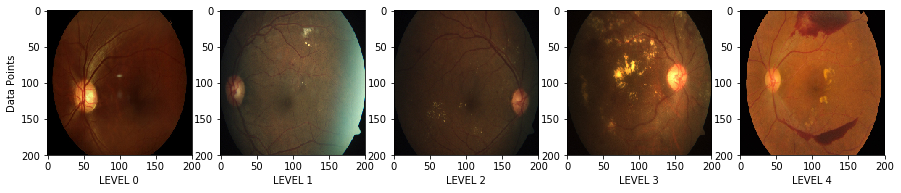

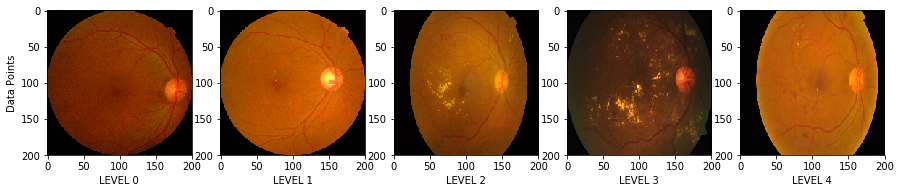

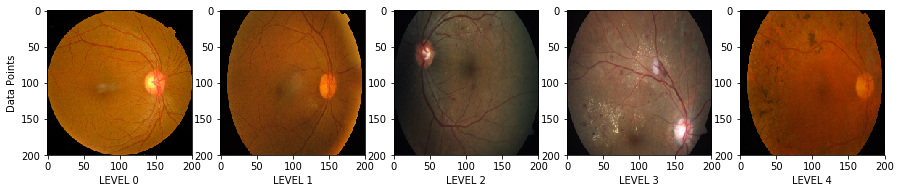

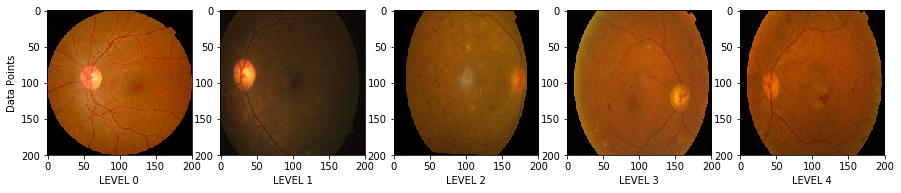

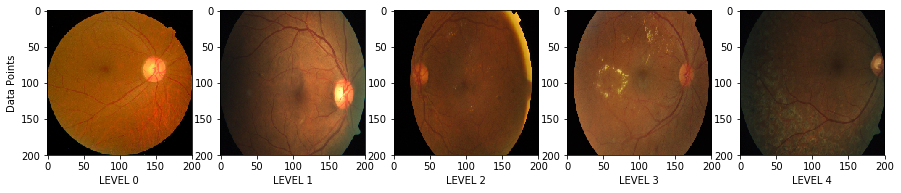

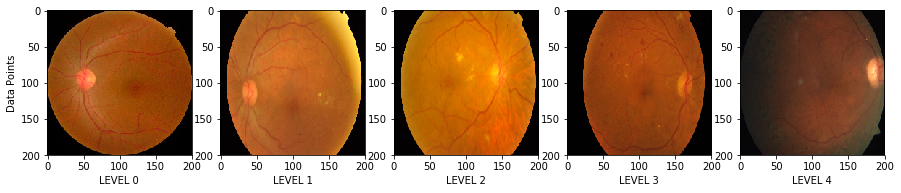

In [ ]:
showImages(df_train,6,color_value=None)

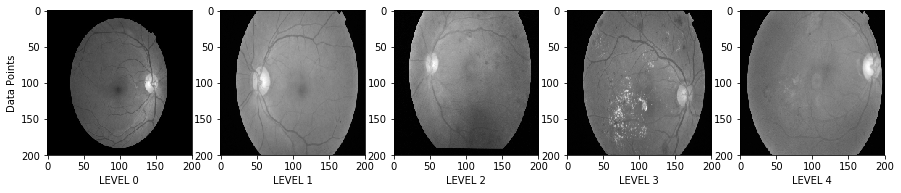

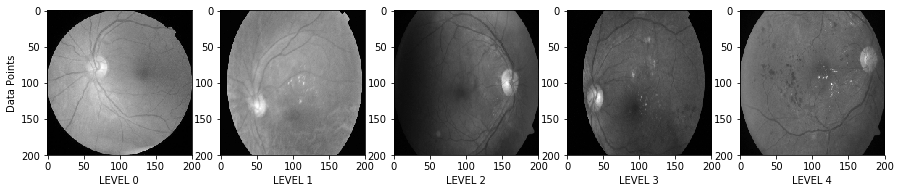

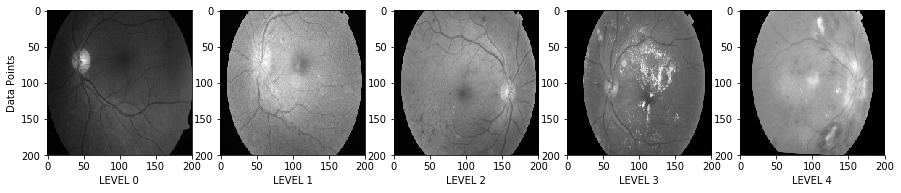

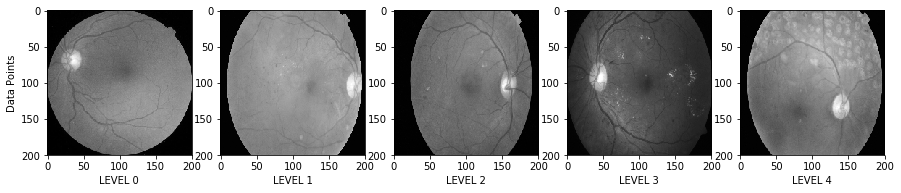

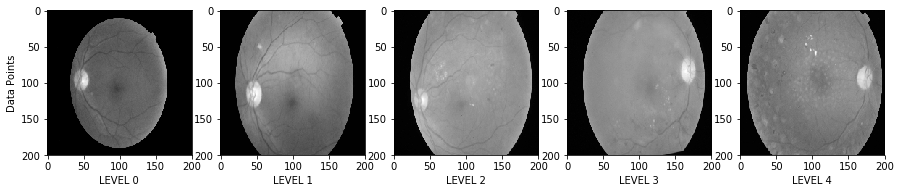

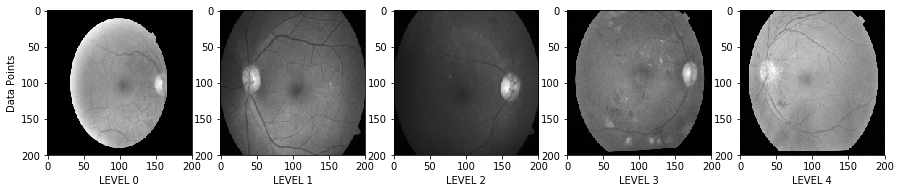

In [ ]:
showImages(df_train,6,color_value='gray')

NameError: name 'color' is not defined

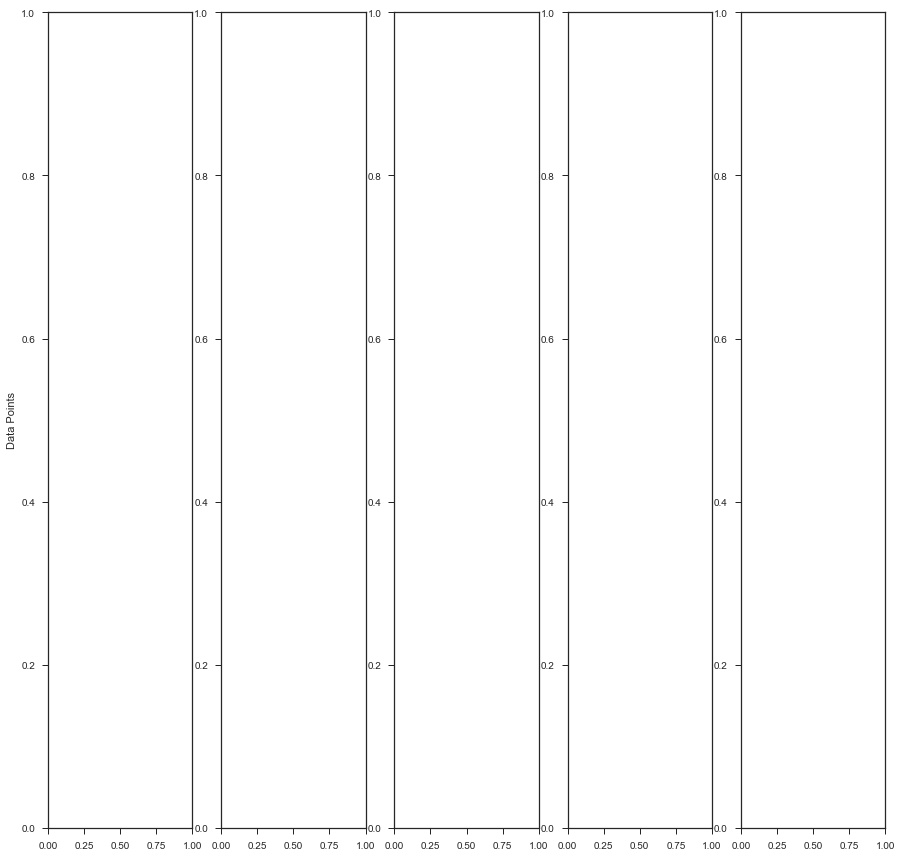

In [ ]:
showImages(df_train,5,color_value='gray')

Now we use the concept of Gaussian blur for processing of images.
In image processing, a Gaussian blur (also known as Gaussian smoothing) is the result of blurring an image by a Gaussian function . It is a widely used effect in graphics software, typically to reduce image noise and reduce detail.

In [ ]:
k=np.random.randint(low=0, high=len(df_train)-1)
img=cv2.imread(df_train.file_path.iloc[k])


In [ ]:
img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img=cv2.resize(img,(Size_of_image,Size_of_image))

In [ ]:
img

array([[[2, 1, 0],
        [1, 0, 0],
        [2, 1, 0],
        ...,
        [1, 0, 0],
        [2, 1, 0],
        [2, 1, 0]],

       [[2, 1, 0],
        [2, 0, 0],
        [2, 1, 0],
        ...,
        [2, 1, 0],
        [2, 1, 0],
        [2, 1, 0]],

       [[2, 1, 0],
        [2, 1, 0],
        [2, 1, 0],
        ...,
        [2, 0, 0],
        [2, 1, 0],
        [2, 1, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

In [ ]:
gaussian_image=cv2.GaussianBlur(img,(0,0),20)

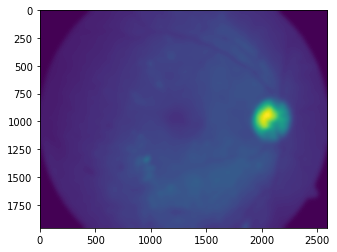

In [ ]:
plot.imshow(gaussian_image)

In [ ]:
gaussian_image

array([[[37, 22, 10],
        [37, 22, 10],
        [37, 22, 10],
        ...,
        [52, 29, 15],
        [52, 28, 15],
        [52, 28, 15]],

       [[37, 22, 10],
        [37, 22, 10],
        [38, 22, 10],
        ...,
        [52, 29, 15],
        [52, 28, 15],
        [52, 28, 15]],

       [[37, 22, 10],
        [37, 22, 10],
        [38, 22, 10],
        ...,
        [52, 29, 15],
        [52, 29, 15],
        [52, 28, 15]],

       ...,

       [[44, 32, 22],
        [44, 32, 22],
        [45, 32, 22],
        ...,
        [45, 22,  9],
        [45, 22,  9],
        [44, 22,  9]],

       [[44, 32, 21],
        [44, 32, 22],
        [44, 32, 22],
        ...,
        [45, 22,  9],
        [44, 22,  9],
        [44, 22,  9]],

       [[44, 32, 21],
        [44, 32, 21],
        [44, 32, 21],
        ...,
        [44, 22,  9],
        [44, 22,  9],
        [44, 22,  9]]], dtype=uint8)

In [ ]:
final_image=cv2.addWeighted(img,4,gaussian_image,-4,128)

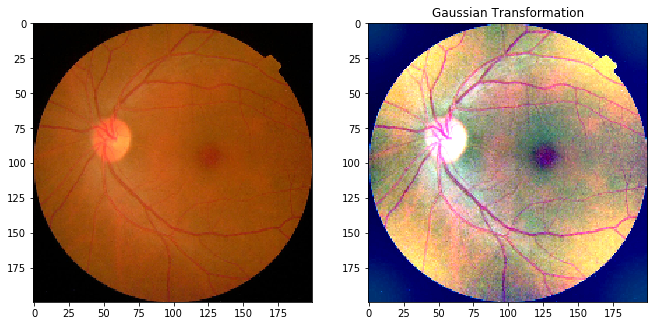

In [ ]:
x,y=plot.subplots(1,2,figsize=(11,11))
y[0].imshow(img)
y[1].imshow(final_image)
plot.title('Gaussian Transformation')
plot.show()

In [ ]:
gaussian_image2=cv2.GaussianBlur(img,(0,0),30)
final_image2=cv2.addWeighted(img,4,gaussian_image2,-4,128)

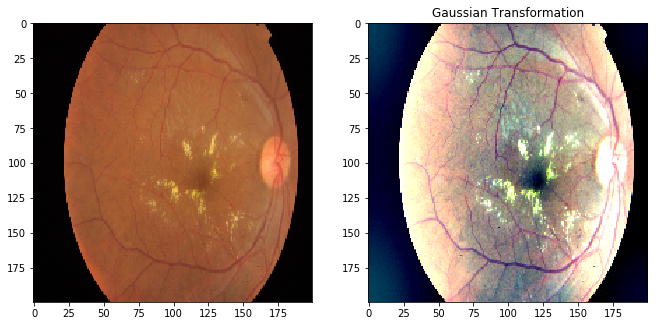

In [ ]:
x,y=plot.subplots(1,2,figsize=(11,11))
y[0].imshow(img)
y[1].imshow(final_image2)
plot.title('Gaussian Transformation')
plot.show()

In [ ]:
img.ndim

3

In [ ]:
img

array([[[3, 1, 2],
        [3, 1, 2],
        [2, 2, 2],
        ...,
        [2, 0, 1],
        [3, 1, 2],
        [3, 1, 2]],

       [[2, 1, 2],
        [3, 1, 2],
        [2, 1, 2],
        ...,
        [3, 1, 2],
        [2, 1, 1],
        [3, 1, 2]],

       [[2, 2, 2],
        [2, 0, 1],
        [2, 0, 1],
        ...,
        [2, 0, 1],
        [1, 1, 1],
        [3, 0, 1]],

       ...,

       [[3, 1, 2],
        [2, 2, 2],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [2, 0, 1],
        [2, 0, 1]],

       [[2, 2, 2],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [2, 0, 1]],

       [[1, 0, 0],
        [2, 0, 1],
        [1, 1, 1],
        ...,
        [2, 0, 0],
        [0, 0, 0],
        [2, 0, 1]]], dtype=uint8)

In [ ]:
final_image2.ndim

3

In [ ]:
img2=grey(img)
img2.ndim

2

In [ ]:
img2

array([[2, 2, 2, ..., 1, 2, 2],
       [1, 2, 1, ..., 2, 1, 2],
       [2, 1, 1, ..., 1, 1, 1],
       ...,
       [2, 2, 1, ..., 1, 1, 1],
       [2, 1, 1, ..., 1, 1, 1],
       [0, 1, 1, ..., 0, 0, 1]], dtype=uint8)

In [ ]:
tol=7
mask=img>tol
mask

array([[[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       ...,

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False,

In [ ]:
mask2=img2>tol
mask2

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [ ]:
#https://codereview.stackexchange.com/questions/132914/crop-black-border-of-image-using-numpy

In [ ]:
mask2.any(1)

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [ ]:
mask2.any(0)

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [ ]:
mask.any(1)

array([[ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True],
       [ T

In [ ]:
np.ix_((img2>tol).any(1),(img2>tol).any(0))

(array([[  0],
        [  1],
        [  2],
        [  3],
        [  4],
        [  5],
        [  6],
        [  7],
        [  8],
        [  9],
        [ 10],
        [ 11],
        [ 12],
        [ 13],
        [ 14],
        [ 15],
        [ 16],
        [ 17],
        [ 18],
        [ 19],
        [ 20],
        [ 21],
        [ 22],
        [ 23],
        [ 24],
        [ 25],
        [ 26],
        [ 27],
        [ 28],
        [ 29],
        [ 30],
        [ 31],
        [ 32],
        [ 33],
        [ 34],
        [ 35],
        [ 36],
        [ 37],
        [ 38],
        [ 39],
        [ 40],
        [ 41],
        [ 42],
        [ 43],
        [ 44],
        [ 45],
        [ 46],
        [ 47],
        [ 48],
        [ 49],
        [ 50],
        [ 51],
        [ 52],
        [ 53],
        [ 54],
        [ 55],
        [ 56],
        [ 57],
        [ 58],
        [ 59],
        [ 60],
        [ 61],
        [ 62],
        [ 63],
        [ 64],
        [ 65],
        [ 

In [ ]:
img2[np.ix_((img2>tol).any(1),(img2>tol).any(0))]

array([[3, 2, 2, ..., 2, 2, 2],
       [1, 0, 2, ..., 1, 2, 1],
       [1, 1, 1, ..., 1, 2, 1],
       ...,
       [1, 1, 1, ..., 2, 2, 2],
       [1, 1, 1, ..., 1, 2, 1],
       [2, 1, 1, ..., 1, 1, 1]], dtype=uint8)

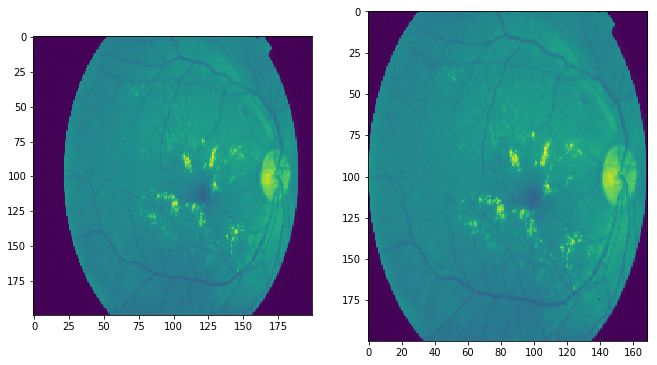

In [ ]:
x,y=plot.subplots(1,2,figsize=(11,11))
y[0].imshow(img2)
y[1].imshow(img2[np.ix_((img2>tol).any(1),(img2>tol).any(0))])


NameError: name 'plot' is not defined

In [ ]:

def crop(img,tolerance=7):
    if img.ndim==2:
        mask=img>tolerance
        return img[np_ix_(mask.any(1),mask.any(0))]
    elif img.ndim==3:
        gray_img=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
        mask= gray_img>tolerance
        
        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # image is too dark so that we crop out everything,
            return img # return original image
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
   
            img = np.stack([img1,img2,img3],axis=-1)

        return img

In [ ]:
def circular(img,sigmax):
    img=crop(img)
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    h,w,d=img.shape
    x=int(w/2)
    y=int(h/2)
    z=np.amin((x,y))
    
    circle_img=np.zeros((h,w),np.uint8)
    cv2.circle(circle_img,(x,y),int(z),1,thickness=-1)
    img = cv2.bitwise_and(img, img, mask=circle_img)
    img = crop(img)
    img=cv2.addWeighted(img,4, cv2.GaussianBlur( img , (0,0) , sigmax) ,-3 ,128)
    return img
    

In [ ]:
k=np.random.randint(low=0, high=len(df_train)-1)
img=cv2.imread(df_train.file_path.iloc[k])

In [ ]:
cropped_img= circular(img,sigmax=30)


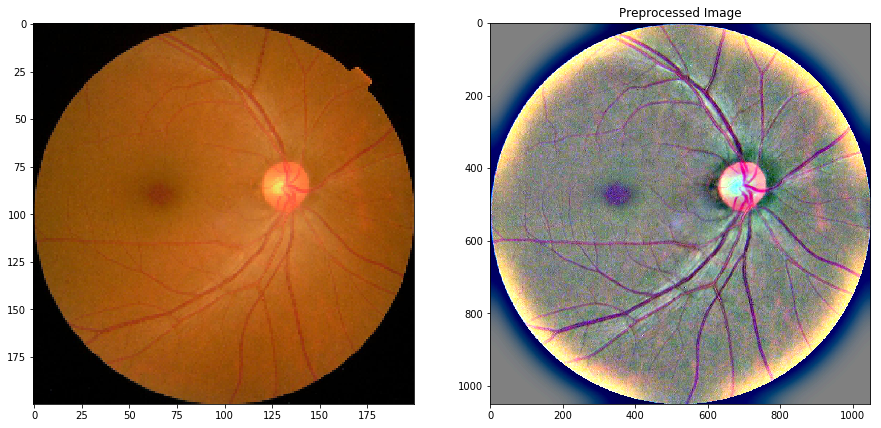

In [ ]:
x,y=plot.subplots(1,2,figsize=(15,15))
y[0].imshow(cv2.resize(cv2.cvtColor(img,cv2.COLOR_BGR2RGB),(Size_of_image,Size_of_image)))
y[1].imshow(cropped_img)
plot.title('Preprocessed Image')
plot.show()

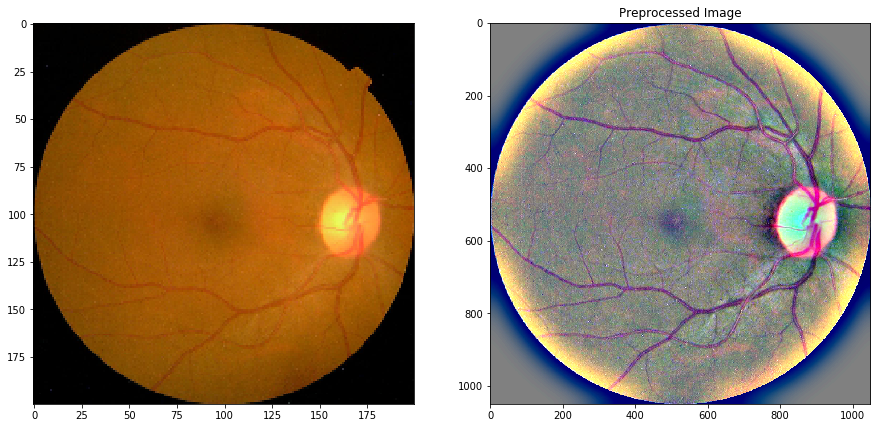

In [ ]:
x,y=plot.subplots(1,2,figsize=(15,15))
y[0].imshow(cv2.resize(cv2.cvtColor(img,cv2.COLOR_BGR2RGB),(Size_of_image,Size_of_image)))
y[1].imshow(cropped_img)
plot.title('Preprocessed Image')
plot.show()

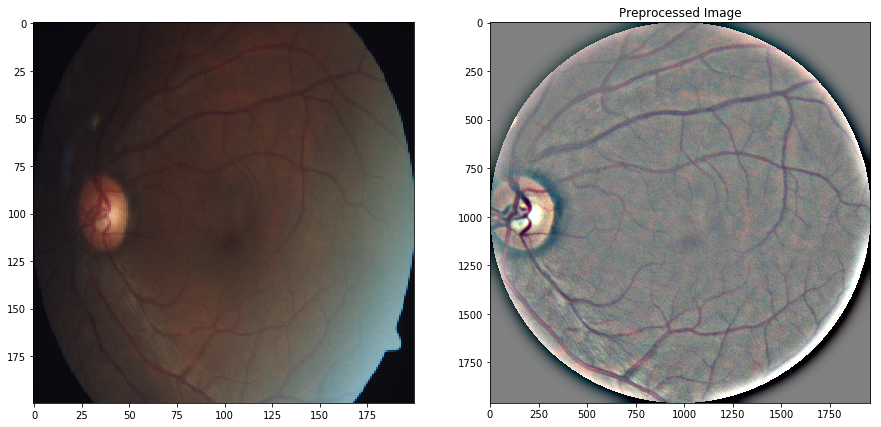

In [ ]:
x,y=plot.subplots(1,2,figsize=(15,15))
y[0].imshow(cv2.resize(cv2.cvtColor(img,cv2.COLOR_BGR2RGB),(Size_of_image,Size_of_image)))
y[1].imshow(cropped_img)
plot.title('Preprocessed Image')
plot.show()

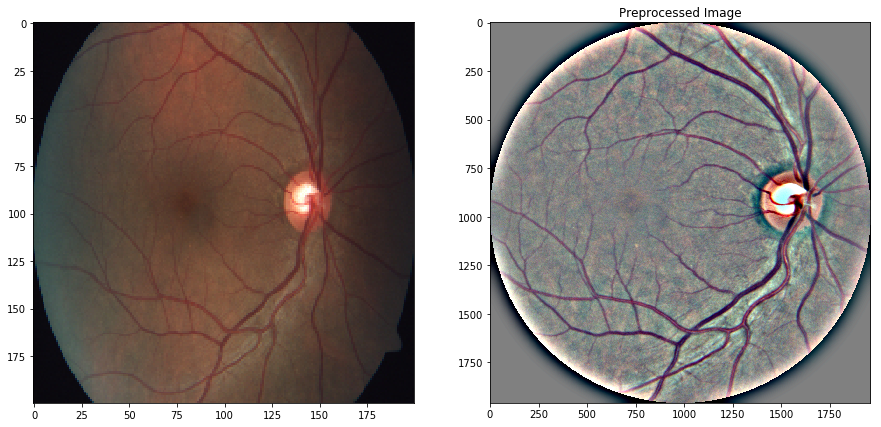

In [ ]:
x,y=plot.subplots(1,2,figsize=(15,15))
y[0].imshow(cv2.resize(cv2.cvtColor(img,cv2.COLOR_BGR2RGB),(Size_of_image,Size_of_image)))
y[1].imshow(cropped_img)
plot.title('Preprocessed Image')
plot.show()

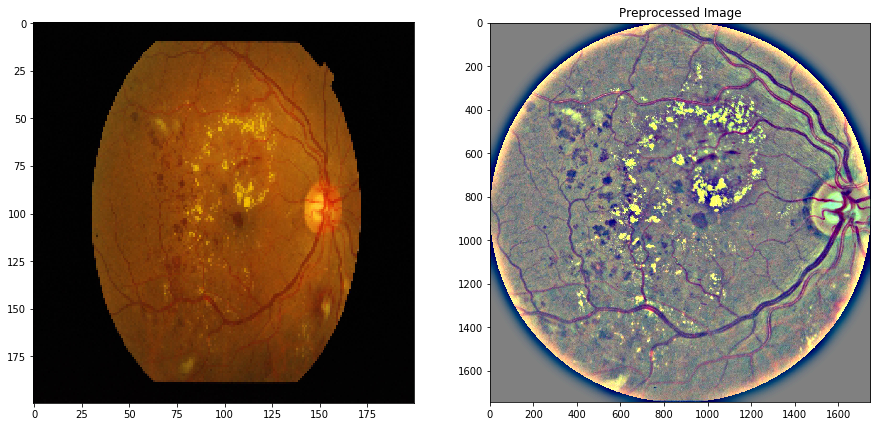

In [ ]:
x,y=plot.subplots(1,2,figsize=(15,15))
y[0].imshow(cv2.resize(cv2.cvtColor(img,cv2.COLOR_BGR2RGB),(Size_of_image,Size_of_image)))
y[1].imshow(cropped_img)
plot.title('Preprocessed Image')
plot.show()

In [ ]:
def showImagesPre(df,classes,sigmax):
    df=df.groupby('diagnosis',group_keys=False).apply(lambda df:df.sample(classes))
    df= df.reset_index(drop=True)
    
    plot.rcParams["axes.grid"]=False
    for i in range(classes):
        x,y=plot.subplots(1,5,figsize= (15,15))
        y[0].set_ylabel("Data Points")
        
        df_arr=df[df.index.isin([i+(classes*0),i+(classes*1),i+(classes*2),i+(classes*3),i+(classes*4)])]
        
        for j in range(5):
            img=cv2.imread(df_arr.file_path.iloc[j])
            img=circular(img,sigmax)
            y[j].imshow(img)
            y[j].set_xlabel('LEVEL '+str(df_arr.diagnosis.iloc[j]))
        
        plot.show()
                

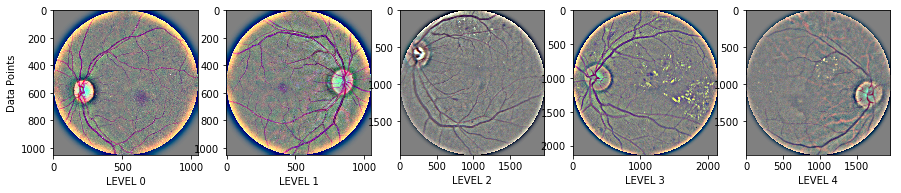

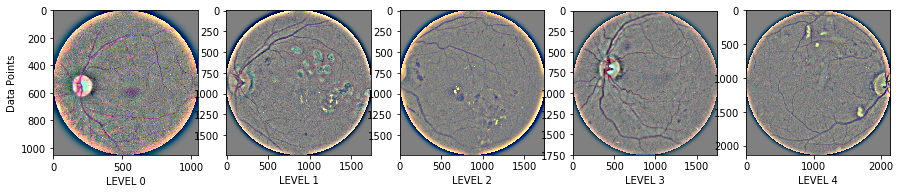

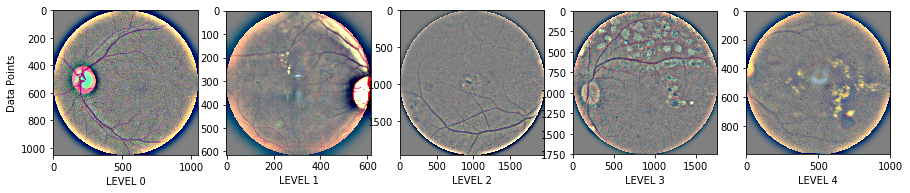

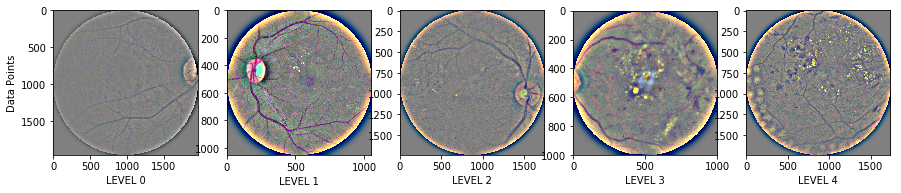

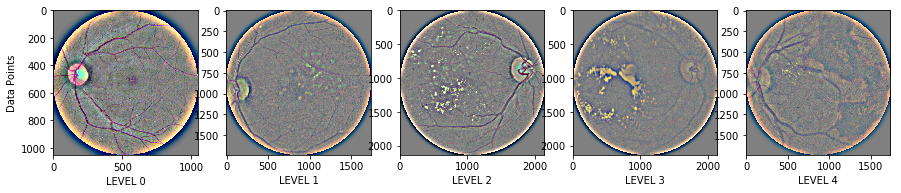

In [ ]:
showImagesPre(df_train,5,sigmax=30) #alpha=4 beta=-4

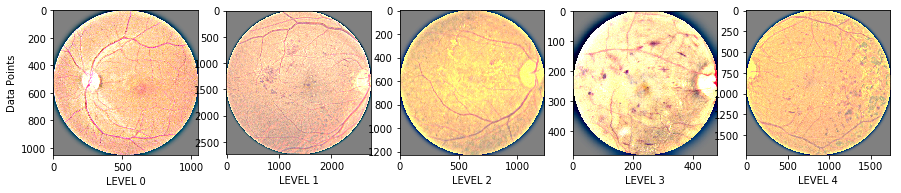

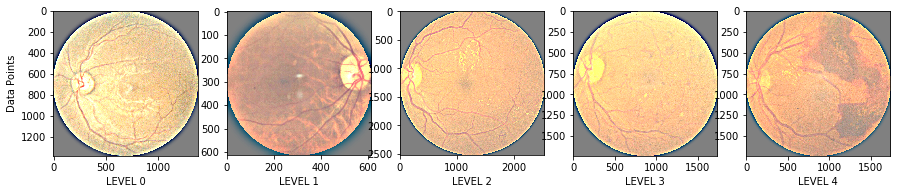

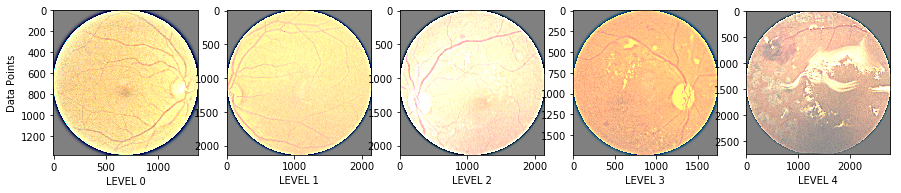

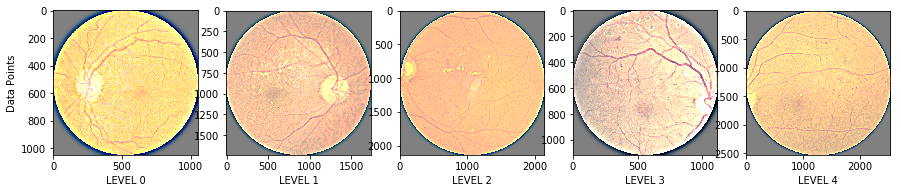

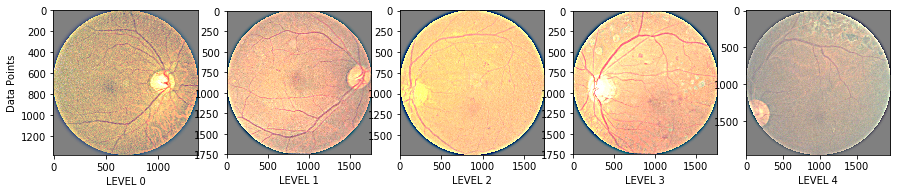

In [ ]:
showImagesPre(df_train,5,sigmax=20)  #alpha is 4 and beta is -3 defined at circular

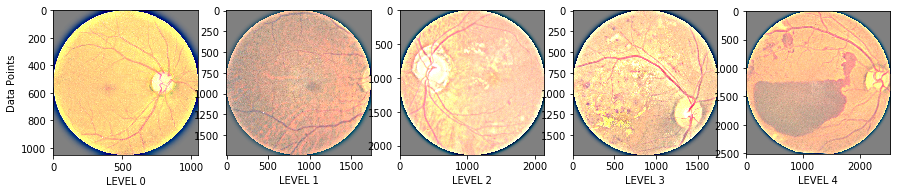

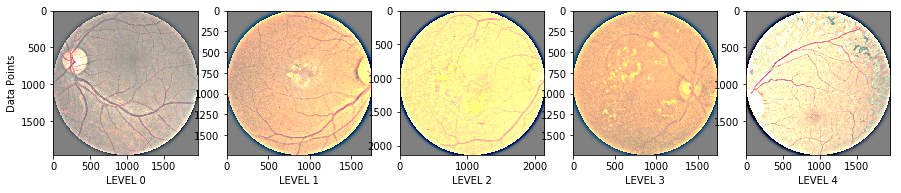

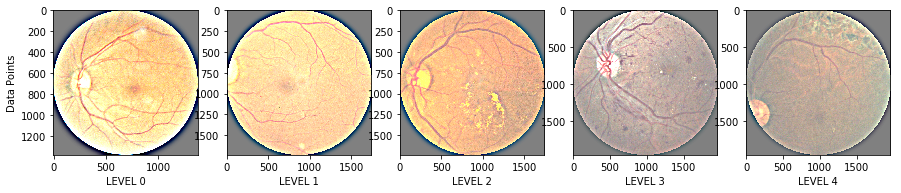

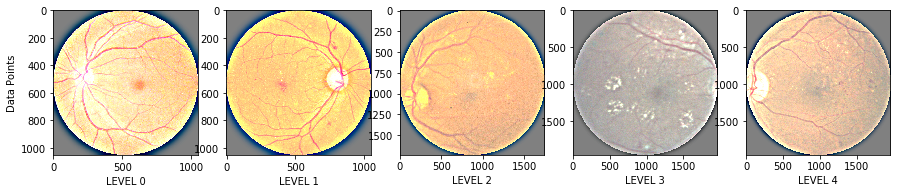

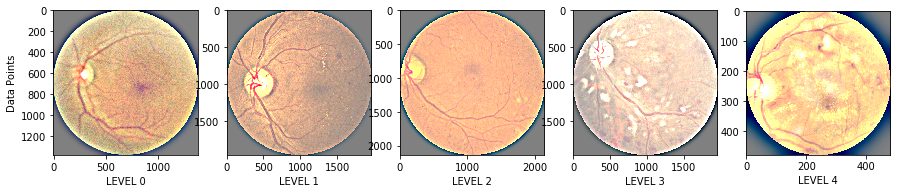

In [ ]:
showImagesPre(df_train,5,sigmax=30) #alpha is 4 and beta is -3 defined at circular

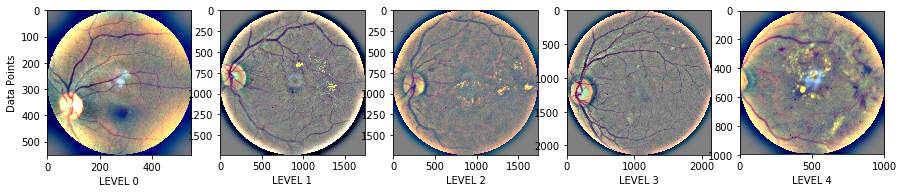

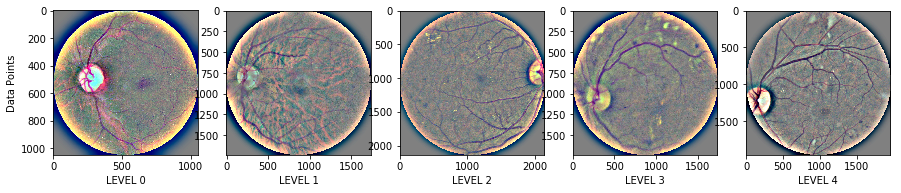

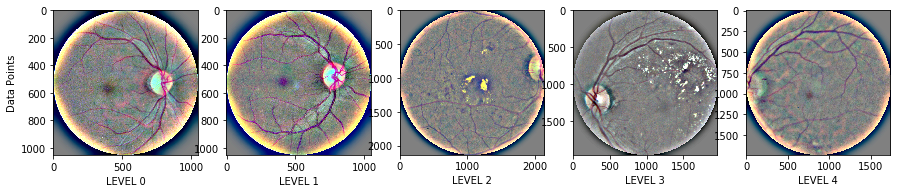

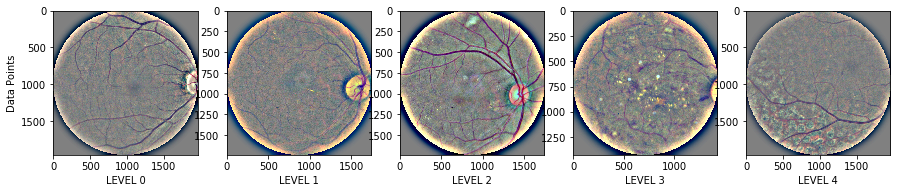

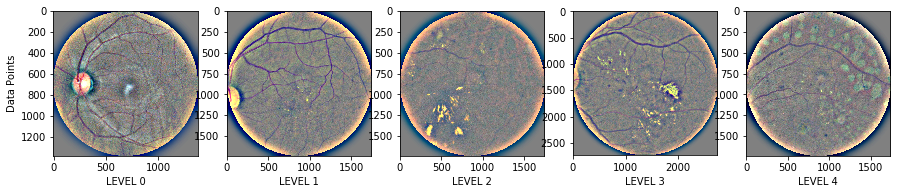

In [ ]:
showImagesPre(df_train,5,sigmax=50)#alpha is 4 and beta is -4 defined at circular

In [ ]:
np.zeros((df_train.shape[0],224,224))

array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       ...,

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0.

In [ ]:
xTrain=np.zeros((df_train.shape[0],224,224))
for i in tqdm_notebook(range(df_train.shape[0])):
    img=cv2.imread(df_train.file_path.iloc[i])
    img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    xTrain[i,:,:]=cv2.resize(img,(224,224))

In [ ]:
np.shape(xTrain)

(3662, 224, 224)

In [ ]:
X=xTrain/255
X=X.reshape(X.shape[0],-1)
train_y= df_train['diagnosis']

In [ ]:
train_y

0       2
1       4
2       1
3       0
4       0
5       4
6       0
7       2
8       2
9       1
10      0
11      2
12      0
13      3
14      1
15      0
16      2
17      0
18      0
19      2
20      2
21      0
22      1
23      2
24      0
25      2
26      0
27      0
28      0
29      0
       ..
3632    0
3633    0
3634    3
3635    1
3636    2
3637    0
3638    0
3639    1
3640    1
3641    0
3642    1
3643    0
3644    0
3645    0
3646    2
3647    0
3648    2
3649    0
3650    0
3651    0
3652    2
3653    0
3654    0
3655    2
3656    4
3657    2
3658    0
3659    2
3660    0
3661    2
Name: diagnosis, Length: 3662, dtype: object

In [ ]:
X

array([[0.00784314, 0.00784314, 0.00784314, ..., 0.01176471, 0.00392157,
        0.00784314],
       [0.00784314, 0.00392157, 0.00784314, ..., 0.00784314, 0.        ,
        0.00784314],
       [0.00784314, 0.00784314, 0.00784314, ..., 0.00784314, 0.00784314,
        0.00784314],
       ...,
       [0.00784314, 0.00784314, 0.00784314, ..., 0.00392157, 0.00392157,
        0.00784314],
       [0.00392157, 0.00392157, 0.01568627, ..., 0.        , 0.        ,
        0.        ],
       [0.01568627, 0.01568627, 0.01568627, ..., 0.01568627, 0.01568627,
        0.01568627]])

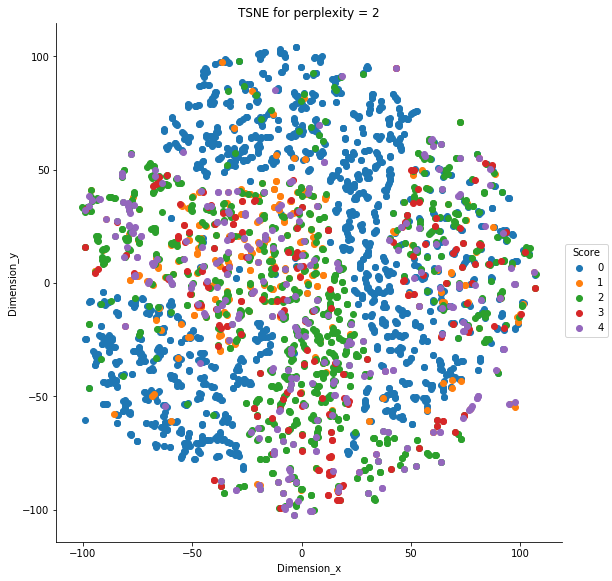

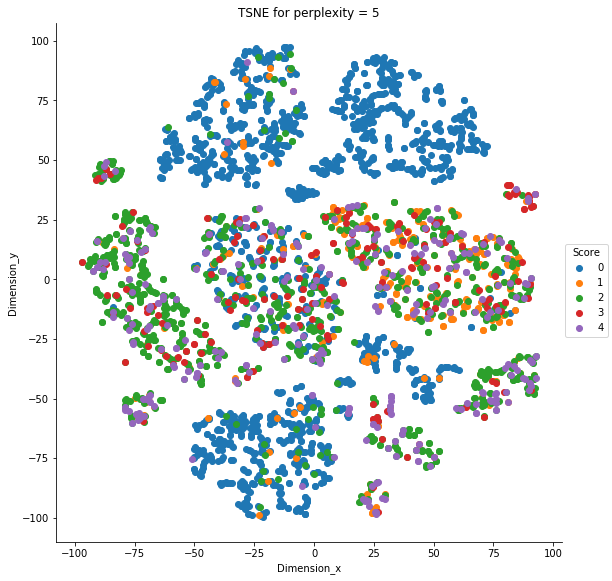

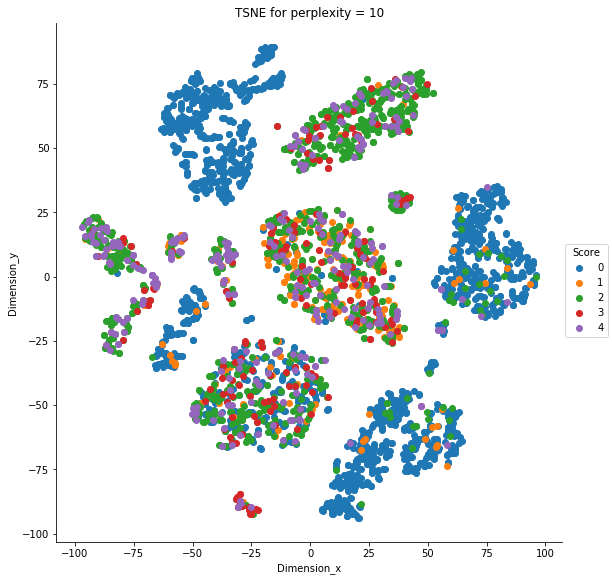

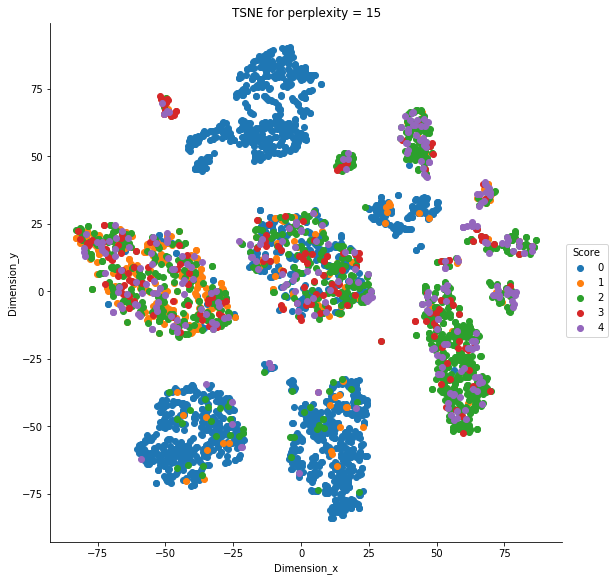

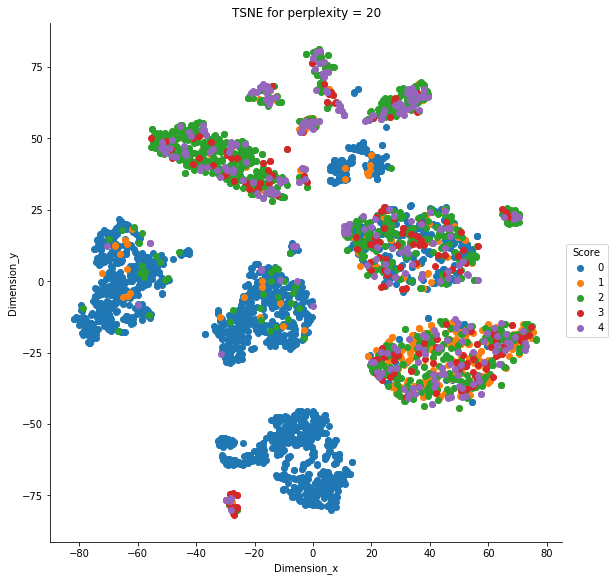

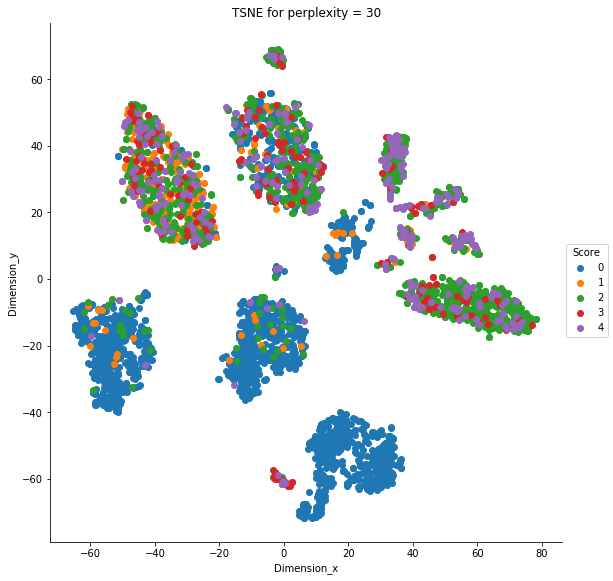

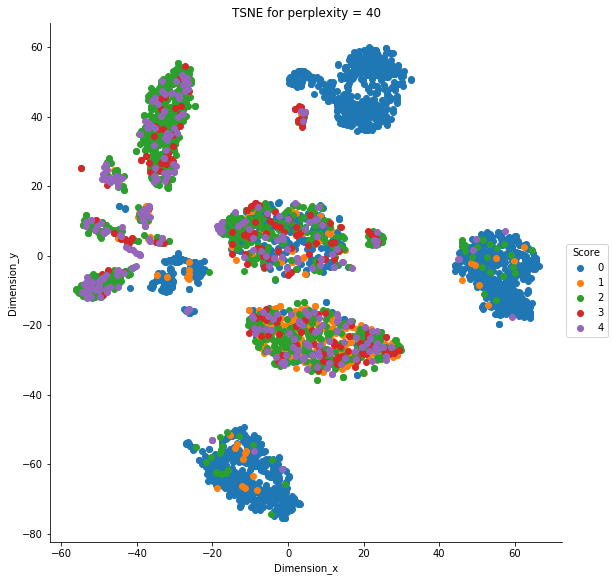

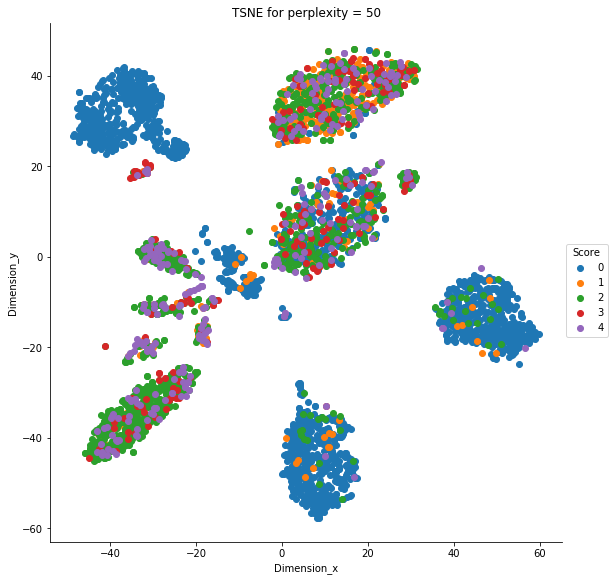

In [ ]:
per_vals = [2,5,10,15,20,30,40,50] #https://www.youtube.com/watch?v=NEaUSP4YerM

for per in tqdm_notebook(per_vals):
    X_decomposed = TSNE(n_components=2,perplexity = per).fit_transform(X)
    df_tsne = pd.DataFrame(data=X_decomposed, columns=['Dimension_x','Dimension_y'])
    df_tsne['Score'] = train_y.values
    
    sns.FacetGrid(df_tsne, hue='Score', size=8).map(plot.scatter, 'Dimension_x', 'Dimension_y').add_legend()
    plot.title('TSNE for perplexity = ' + str(per))
    plot.show()

In [ ]:
from sklearn.model_selection import train_test_split

df_train_train,df_train_valid = train_test_split(df_train,test_size = 0.2)
print(df_train_train.shape,df_train_valid.shape)

(2929, 4) (733, 4)


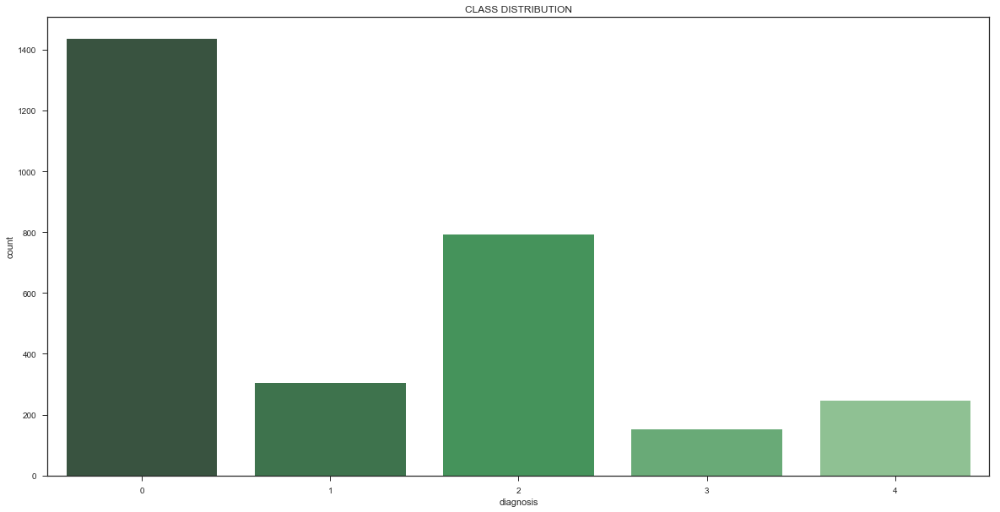

In [ ]:
visualize_classes(df_train_train)

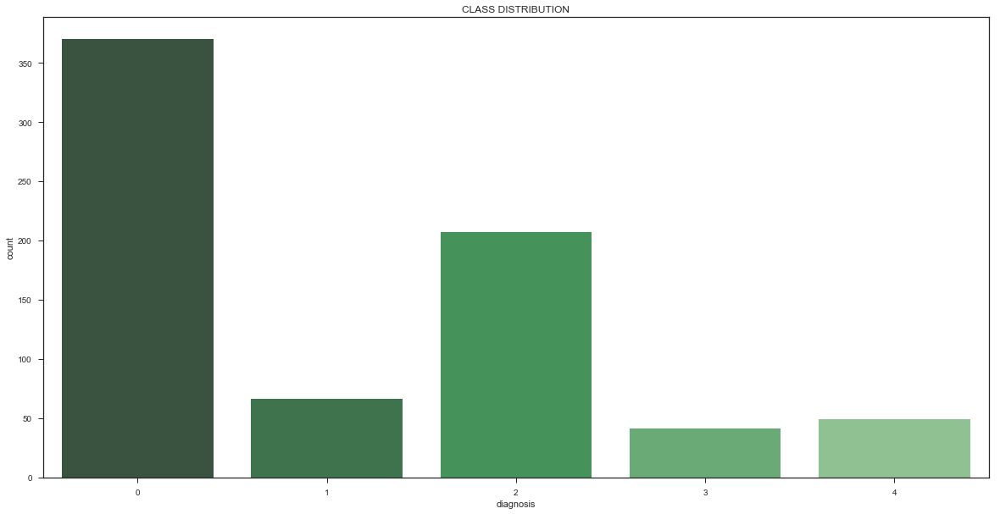

In [ ]:
visualize_classes(df_train_test)

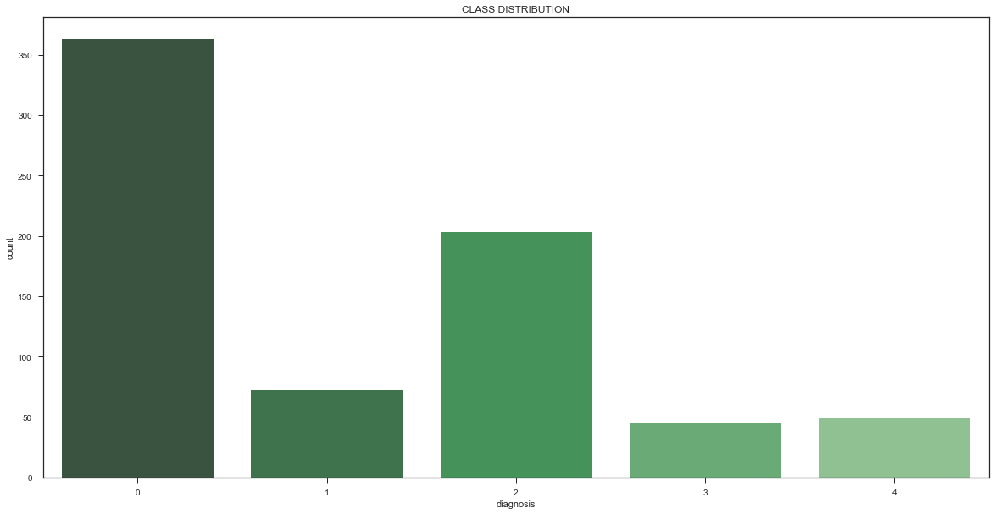

In [ ]:
visualize_classes(df_train_test)

In [ ]:
file=open('df_train_train','rb')
df_train_train = pickle.load(file)
file.close()

file = open('df_train_valid', 'rb')
df_train_valid = pickle.load(file)
file.close()

In [ ]:
print(df_train_train.shape,df_train_valid.shape)

(2929, 4) (733, 4)


In [ ]:
os.getcwd()

'C:\\Users\\Sabarish\\Downloads\\aptos2019-blindness-detection'

In [ ]:
IMG_SIZE=512
def image_preprocess_save(file):
    input_filepath = os.path.join(os.getcwd(),'train_images',file)
    output_filepath = os.path.join(os.getcwd(),'train_images_preprocessed',file)
    img = cv2.imread(input_filepath)
   # img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img=cv2.resize(cv2.cvtColor(img,cv2.COLOR_BGR2RGB),(IMG_SIZE,IMG_SIZE))
    img=circular(img,20)
    cv2.imwrite(output_filepath,img)

In [ ]:
for i in xa:
    image_preprocess_save(i)

In [ ]:
image_preprocess_save('00cb6555d108.png')

In [ ]:
input_filepath

"C:\\Users\\Sabarish\\Downloads\\aptos2019-blindness-detection\\train_images/<_io.BufferedReader name='df_train_valid'>.png"

In [ ]:
output_filepath

"./valid_images_resized\\<_io.BufferedReader name='df_train_valid'>.png"

In [ ]:


file = open('df_train_train1', 'wb')
pickle.dump(df_train_train, file)
file.close()

file = open('df_train_test1', 'wb')
pickle.dump(df_train_test, file)
file.close()


In [ ]:
ya=os.listdir('test_images')

In [ ]:
IMG_SIZE=512
def image_preprocess_save(file):
    input_filepath = os.path.join(os.getcwd(),'test_images',file)
    output_filepath = os.path.join(os.getcwd(),'test_images_preprocessed',file)
    img = cv2.imread(input_filepath)
   # img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img=cv2.resize(cv2.cvtColor(img,cv2.COLOR_BGR2RGB),(IMG_SIZE,IMG_SIZE))
    img=circular(img,20)
    cv2.imwrite(output_filepath,img)

In [ ]:
for i in ya:
    image_preprocess_save(i)

In [ ]:
def load_data():
    file = open('df_train_train', 'rb')
    df_train_train = pickle.load(file)
    file.close()

    file = open('df_train_test', 'rb')
    df_train_test = pickle.load(file)
    file.close()
    
    return df_train_train,df_train_test

In [ ]:
df_train_train,df_train_test = load_data()
print(df_train_train.shape,df_train_test.shape,'\n')
df_train_train.head(6)


(2929, 4) (733, 4) 



,id_code,diagnosis,file_path,file_name
1768,7d0a871c45db,0,./train_images/7d0a871c45db.png,7d0a871c45db.png
927,4318b6adeb97,0,./train_images/4318b6adeb97.png,4318b6adeb97.png
3017,d1ca85af57c9,0,./train_images/d1ca85af57c9.png,d1ca85af57c9.png
2189,9a1029536d78,0,./train_images/9a1029536d78.png,9a1029536d78.png
1852,82deb07a6618,2,./train_images/82deb07a6618.png,82deb07a6618.png
2660,b86fb2d5be1a,0,./train_images/b86fb2d5be1a.png,b86fb2d5be1a.png


In [ ]:
df_train_test.head(6)

,id_code,diagnosis,file_path,file_name
300,164cd5a3a6cd,0,./train_images/164cd5a3a6cd.png,164cd5a3a6cd.png
353,19ef4d292196,4,./train_images/19ef4d292196.png,19ef4d292196.png
2815,c31651ea04c6,3,./train_images/c31651ea04c6.png,c31651ea04c6.png
2748,be521870a0ea,0,./train_images/be521870a0ea.png,be521870a0ea.png
2159,98277aeb96a7,0,./train_images/98277aeb96a7.png,98277aeb96a7.png
3257,e25ccfe38e44,1,./train_images/e25ccfe38e44.png,e25ccfe38e44.png


In [ ]:
from keras_preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Activation, Flatten, Dropout, BatchNormalization
from keras.layers import Conv2D, MaxPooling2D
from keras import regularizers, optimizers

In [ ]:
BATCH_SIZE = 8
EPOCHS = 40
WARMUP_EPOCHS = 4
LEARNING_RATE = 1e-4
WARMUP_LEARNING_RATE = 1e-3
HEIGHT = 320
WIDTH = 320
CANAL = 3
N_CLASSES = df_train_train['diagnosis'].nunique()
ES_PATIENCE = 5
RLROP_PATIENCE = 3
DECAY_DROP = 0.5

In [ ]:
def img_generator(train,test):
    train_datagen=ImageDataGenerator(rescale=1./255, validation_split=0.2,horizontal_flip=True)
    
    train_generator=train_datagen.flow_from_dataframe(dataframe=df_train,
                                                      directory="C:/Users/Sabarish/Downloads/aptos2019-blindness-detection/train_images_preprocessed",
                                                      x_col="file_name",
                                                      y_col="diagnosis",
                                                      batch_size=BATCH_SIZE,
                                                      class_mode="categorical",
                                                      target_size=(HEIGHT, WIDTH),
                                                      subset='training')
    
    valid_generator=train_datagen.flow_from_dataframe(dataframe=df_train,
                                                      directory="C:/Users/Sabarish/Downloads/aptos2019-blindness-detection/train_images_preprocessed",
                                                      x_col="file_name",
                                                      y_col="diagnosis",
                                                      batch_size=BATCH_SIZE,
                                                      class_mode="categorical",    
                                                      target_size=(HEIGHT, WIDTH),
                                                      subset='validation')
    
    test_datagen = ImageDataGenerator(rescale=1./255)
    test_generator = test_datagen.flow_from_dataframe(dataframe=df_test,
                                                      directory = "C:/Users/Sabarish/Downloads/aptos2019-blindness-detection/test_images_preprocessed",
                                                      x_col="file_name",
                                                      y_col=None,
                                                      target_size=(HEIGHT, WIDTH),
                                                      batch_size=1,
                                                      shuffle=False,
                                                      class_mode=None)
    
    return train_generator,valid_generator,test_generator

In [ ]:
train_generator,valid_generator,test_generator = img_generator(df_train_train,df_train_test)

Found 2930 validated image filenames belonging to 5 classes.
Found 732 validated image filenames belonging to 5 classes.
Found 1928 validated image filenames.


In [ ]:
from sklearn.model_selection import train_test_split

df_train_train,df_train_test = train_test_split(df_train,test_size = 0.2)
print(df_train_train.shape,df_train_valid.shape)

(2929, 4) (733, 4)


In [ ]:
def create_model(input_shape, n_out):
    input_tensor = Input(shape=input_shape)
    base_model = applications.ResNet50(weights=None, include_top=False,input_tensor=input_tensor)
    base_model.load_weights('resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5')

    x = GlobalAveragePooling2D()(base_model.output)
    x = Dropout(0.5)(x)
    x = Dense(2048, activation='relu')(x)
    x = Dropout(0.5)(x)
    final_output = Dense(n_out, activation='softmax', name='final_output')(x)
    model = Model(input_tensor, final_output)
    return model


In [ ]:
model = create_model(input_shape=(HEIGHT, WIDTH, CANAL), n_out=N_CLASSES)

for layer in model.layers:
    layer.trainable = False

for i in range(-5, 0):
    model.layers[i].trainable = True
model.summary()

Instructions for updating:
Colocations handled automatically by placer.


C:\Users\Sabarish\Anaconda3\lib\site-packages\keras_applications\resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 320, 320, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 326, 326, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 160, 160, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 160, 160, 64) 256         conv1[0][0]                      
____________________________________________________________________________________________

In [ ]:
STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size
print(STEP_SIZE_TRAIN,STEP_SIZE_VALID)

366 91


In [ ]:
model.compile(optimizer = optimizers.Adam(lr=WARMUP_LEARNING_RATE),loss = 'categorical_crossentropy',metrics = ['accuracy'])

history_warmup = model.fit_generator(generator=train_generator,
                                     steps_per_epoch=STEP_SIZE_TRAIN,
                                     validation_data=valid_generator,validation_steps=STEP_SIZE_VALID,
                                     epochs=WARMUP_EPOCHS,
                                     verbose=1).history

Epoch 1/2
366/366 [==============================] - 3300s 9s/step - loss: 1.3128 - acc: 0.6137 - val_loss: 2.5751 - val_acc: 0.4629
Epoch 2/2
366/366 [==============================] - 2478s 7s/step - loss: 0.8410 - acc: 0.6902 - val_loss: 2.6769 - val_acc: 0.4586


In [ ]:
#https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

for layer in model.layers:
    layer.trainable = True

es = EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
rlrop = ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)

callback_list = [es, rlrop]
optimizer = optimizers.Adam(lr=LEARNING_RATE)
model.compile(optimizer=optimizer, loss="binary_crossentropy",  metrics=['accuracy'])
model.summary()

TypeError: __init__() got an unexpected keyword argument 'restore_best_weights'

In [ ]:
import keras
from keras import applications
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers,Model,Sequential
from keras.layers import Input,GlobalAveragePooling2D,Dropout,Dense,Activation
from keras.callbacks import EarlyStopping,ReduceLROnPlateau

Using TensorFlow backend.
C:\Users\Sabarish\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\Sabarish\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\Sabarish\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\Sabarish\Anaconda3\lib\site-packages\tensorflow\python\framewo

AttributeError: module 'tensorflow.python.keras.backend' has no attribute 'get_graph'

In [ ]:
! pip install --upgrade Keras

  Using cached https://files.pythonhosted.org/packages/44/e1/dc0757b20b56c980b5553c1b5c4c32d378c7055ab7bfa92006801ad359ab/Keras-2.4.3-py2.py3-none-any.whl
Requirement not upgraded as not directly required: numpy>=1.9.1 in c:\users\sabarish\anaconda3\lib\site-packages (from Keras) (1.19.5)
Requirement not upgraded as not directly required: pyyaml in c:\users\sabarish\anaconda3\lib\site-packages (from Keras) (3.12)
Requirement not upgraded as not directly required: scipy>=0.14 in c:\users\sabarish\anaconda3\lib\site-packages (from Keras) (1.1.0)
Requirement not upgraded as not directly required: h5py in c:\users\sabarish\anaconda3\lib\site-packages (from Keras) (2.7.1)
Requirement not upgraded as not directly required: six in c:\users\sabarish\anaconda3\lib\site-packages (from h5py->Keras) (1.11.0)
  Found existing installation: Keras 2.3.0
    Uninstalling Keras-2.3.0:
      Successfully uninstalled Keras-2.3.0


In [ ]:
import keras


In [ ]:
! pip install --upgrade tensorflow

  Using cached https://files.pythonhosted.org/packages/e6/ba/fd12c5be5ca36c114611aa2fc0f732bac1b46dd8bdeca8b7657d48f3774a/tensorflow-2.4.1-cp36-cp36m-win_amd64.whl
  Using cached https://files.pythonhosted.org/packages/3b/7c/1aac65aa4be8eb866c541b035067e09c639c7399959d87c6fffad427b324/protobuf-3.15.6-cp36-cp36m-win_amd64.whl
  Using cached https://files.pythonhosted.org/packages/0b/fa/bee65d2dbdbd3611702aafd128139c53c90a1285f169ba5467aab252e27a/h5py-2.10.0-cp36-cp36m-win_amd64.whl
  Using cached https://files.pythonhosted.org/packages/bc/19/404708a7e54ad2798907210462fd950c3442ea51acc8790f3da48d2bee8b/opt_einsum-3.3.0-py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/64/21/eebd23060763fedeefb78bc2b286e00fa1d8abda6f70efa2ee08c28af0d4/tensorboard-2.4.1-py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/92/c9/ef0fae29182d7a867d203f0eff8296b60da92098cc41db33a434f4be84bf/absl_py-0.12.0-py3-none-any.whl
  Using cached https://files.pythonhosted.org/p

Could not install packages due to an EnvironmentError: [WinError 5] Access is denied: 'C:\\Users\\Public\\Documents\\Wondershare\\CreatorTemp\\pip-uninstall-2wf0e5b5\\users\\sabarish\\anaconda3\\lib\\site-packages\\google\\protobuf\\internal\\_api_implementation.cp36-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



In [ ]:
from tensorflow.python.keras import backend as k

In [ ]:
model.compile(optimizer = optimizers.Adam(lr=WARMUP_LEARNING_RATE),loss = 'categorical_crossentropy',metrics = ['accuracy'])

history_warmup = model.fit_generator(generator=train_generator,
                                     steps_per_epoch=STEP_SIZE_TRAIN,
                                     validation_data=valid_generator,validation_steps=STEP_SIZE_VALID,
                                     epochs=WARMUP_EPOCHS,
                                     verbose=1).history

Instructions for updating:
Use tf.cast instead.
Epoch 1/4
366/366 [==============================] - 2881s 8s/step - loss: 1.6340 - accuracy: 0.6177 - val_loss: 1.4478 - val_accuracy: 0.1058
Epoch 2/4
366/366 [==============================] - 2861s 8s/step - loss: 0.8246 - accuracy: 0.7023 - val_loss: 1.4335 - val_accuracy: 0.4613
Epoch 3/4
366/366 [==============================] - 2880s 8s/step - loss: 0.8004 - accuracy: 0.7084 - val_loss: 1.1285 - val_accuracy: 0.4669
Epoch 4/4
366/366 [==============================] - 2868s 8s/step - loss: 0.7817 - accuracy: 0.7012 - val_loss: 0.8571 - val_accuracy: 0.4530


In [ ]:
import keras
from keras import applications
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers,Model,Sequential
from keras.layers import Input,GlobalAveragePooling2D,Dropout,Dense,Activation
from keras.callbacks import EarlyStopping,ReduceLROnPlateau

In [ ]:
for layer in model.layers:
    layer.trainable = True

es = EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
rlrop = ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)

callback_list = [es, rlrop]
optimizer = optimizers.Adam(lr=LEARNING_RATE)
model.compile(optimizer=optimizer, loss="binary_crossentropy",  metrics=['accuracy'])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 320, 320, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 326, 326, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 160, 160, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 160, 160, 64) 256         conv1[0][0]                      
____________________________________________________________________________________________

In [ ]:
history_finetunning = model.fit_generator(generator=train_generator,
                                          steps_per_epoch=STEP_SIZE_TRAIN,
                                          validation_data=valid_generator,
                                          validation_steps=STEP_SIZE_VALID,
                                          epochs=EPOCHS,
                                          callbacks=callback_list,
                                          verbose=1).history

Epoch 1/40
366/366 [==============================] - 10332s 28s/step - loss: 0.2327 - accuracy: 0.9005 - val_loss: 1.5266 - val_accuracy: 0.7841
Epoch 2/40
366/366 [==============================] - 10560s 29s/step - loss: 0.2042 - accuracy: 0.9161 - val_loss: 0.2820 - val_accuracy: 0.8472
Epoch 3/40
366/366 [==============================] - 10875s 30s/step - loss: 0.1814 - accuracy: 0.9241 - val_loss: 0.1439 - val_accuracy: 0.9196
Epoch 4/40
366/366 [==============================] - 10156s 28s/step - loss: 0.1629 - accuracy: 0.9321 - val_loss: 0.0904 - val_accuracy: 0.9061
Epoch 5/40
366/366 [==============================] - 9950s 27s/step - loss: 0.1430 - accuracy: 0.9417 - val_loss: 0.6599 - val_accuracy: 0.9000
Epoch 6/40
366/366 [==============================] - 11019s 30s/step - loss: 0.1360 - accuracy: 0.9464 - val_loss: 0.2107 - val_accuracy: 0.8751
Epoch 7/40
366/366 [==============================] - 11573s 32s/step - loss: 0.1251 - accuracy: 0.9491 - val_loss: 0.2783 - 

In [ ]:
model.save_weights('DRmodel.h5')

In [ ]:
model.save("myDRmodel.h5")

In [ ]:
model.load_weights('DRmodel.h5')

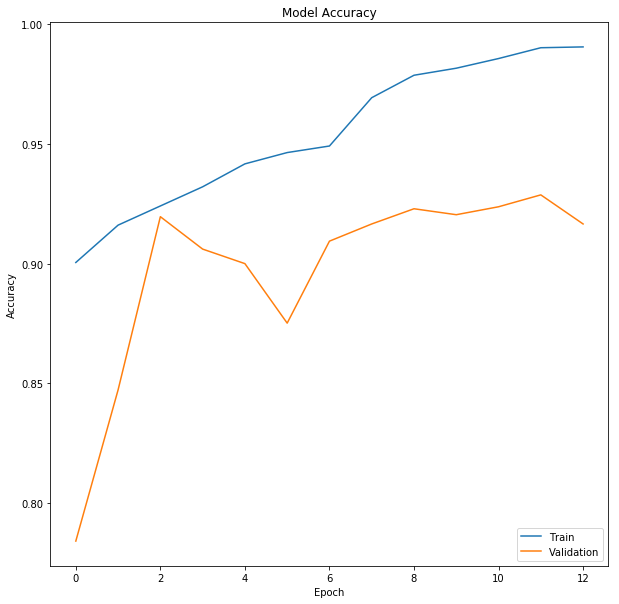

In [ ]:
plot.figure(figsize=(10,10))

plot.plot(history_finetunning['accuracy'])
plot.plot(history_finetunning['val_accuracy'])
plot.title('Model Accuracy')
plot.ylabel('Accuracy')
plot.xlabel('Epoch')
plot.legend(['Train', 'Validation'], loc='lower right')
plot.gca().ticklabel_format(axis='both', style='plain', useOffset=False)
plot.show()

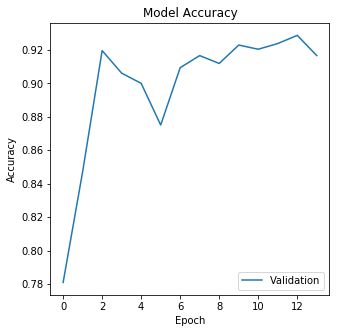

In [ ]:
plot.figure(figsize=(5,5))
plot.plot(history_finetunning['val_accuracy']
plot.title('Model Accuracy')
plot.ylabel('Accuracy')
plot.xlabel('Epoch')
plot.legend( ['Validation'], loc='lower right')
plot.gca().ticklabel_format(axis='both', style='plain', useOffset=False)
plot.show()

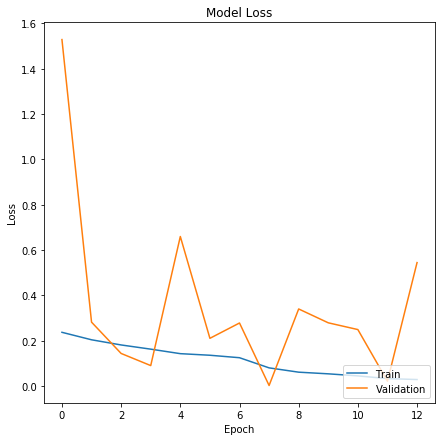

In [ ]:
plot.figure(figsize=(7,7))
plot.plot(history_finetuning[loss])
plot.plot(history_finetuning[val_loss])
plot.title('Model Loss')
plot.ylabel('Loss')
plot.xlabel('Epoch')
plot.legend( ['Train','Validation'], loc='lower right')
plot.gca().ticklabel_format(axis='both', style='plain', useOffset=False)
plot.show()

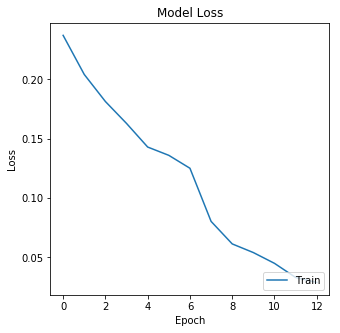

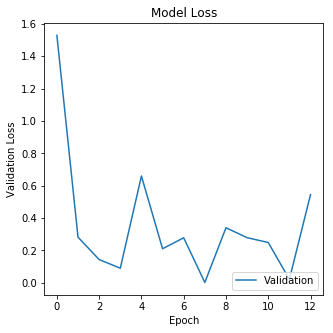

In [ ]:
plot.figure(figsize=(5,5))
plot.plot(history_finetuning[loss])
plot.title('Model Loss')
plot.ylabel('Loss')
plot.xlabel('Epoch')
plot.legend( ['Train'], loc='lower right')
plot.gca().ticklabel_format(axis='both', style='plain', useOffset=False)
plot.show()

plot.figure(figsize=(5,5))
plot.plot(history_finetuning[val_loss])
plot.title('Model Loss')
plot.ylabel('Validation Loss')
plot.xlabel('Epoch')
plot.legend( ['Validation'], loc='lower right')
plot.gca().ticklabel_format(axis='both', style='plain', useOffset=False)
plot.show()

In [ ]:
comp_datagen = ImageDataGenerator(rescale=1./255)
comp_generator = comp_datagen.flow_from_dataframe(dataframe=df_train_train,
                                                          directory = "C:/Users/Sabarish/Downloads/aptos2019-blindness-detection/train_images_preprocessed",
                                                          x_col="file_name",
                                                          target_size=(HEIGHT, WIDTH),
                                                          batch_size=1,
                                                          shuffle=False,
                                                          class_mode=None)

stepSizeComp = comp_generator.n//comp_generator.batch_size
train_preds = model.predict_generator(comp_generator, steps=stepSizeComp,verbose = 1)
train_preds = [np.argmax(pred) for pred in train_preds]

Found 2929 validated image filenames.
2929/2929 [==============================] - 1891s 645ms/step


In [ ]:
from sklearn.metrics import confusion_matrix, cohen_kappa_score,accuracy_score
print("Train Cohen Kappa score: %.3f" % cohen_kappa_score(train_preds, df_train_train['diagnosis'].astype('int'), weights='quadratic'))
print("Train Accuracy score : %.3f" % accuracy_score(df_train_train['diagnosis'].astype('int'),train_preds))

Train Cohen Kappa score: 0.945
Train Accuracy score : 0.921


In [ ]:
test_generator1.reset()
stepsizeTest = test_generator1.n//test_generator1.batch_size
test_preds = model.predict_generator(test_generator1, steps=stepsizeTest,verbose = 1)
test_labels = [np.argmax(pred) for pred in test_preds]

733/733 [==============================] - 446s 608ms/step


In [ ]:
test_preds

array([[1.77956626e-05, 6.15329854e-02, 9.35595453e-01, 5.58598898e-04,
        2.29518930e-03],
       [1.96726542e-05, 9.98787463e-01, 1.17236155e-03, 1.89591205e-07,
        2.03809832e-05],
       [5.84249559e-04, 1.01013415e-01, 8.00119400e-01, 3.04378700e-02,
        6.78449646e-02],
       ...,
       [9.99995112e-01, 4.38121515e-06, 5.09615688e-07, 1.34759093e-10,
        3.66830744e-09],
       [1.32235189e-04, 8.62305686e-02, 8.79845381e-01, 2.94164568e-03,
        3.08501814e-02],
       [9.99975681e-01, 2.36381311e-05, 7.36059121e-07, 6.82784515e-12,
        8.03174527e-10]], dtype=float32)

In [ ]:
test_labels

[2,
 1,
 2,
 0,
 0,
 3,
 2,
 0,
 0,
 1,
 2,
 0,
 0,
 3,
 4,
 0,
 2,
 1,
 0,
 0,
 0,
 4,
 0,
 0,
 0,
 1,
 2,
 2,
 0,
 1,
 0,
 0,
 2,
 4,
 2,
 0,
 0,
 0,
 2,
 4,
 0,
 0,
 3,
 0,
 3,
 0,
 0,
 0,
 2,
 2,
 0,
 2,
 1,
 0,
 0,
 4,
 0,
 3,
 0,
 0,
 4,
 4,
 2,
 0,
 2,
 0,
 0,
 4,
 2,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 2,
 0,
 3,
 0,
 0,
 0,
 1,
 2,
 1,
 0,
 2,
 2,
 0,
 0,
 2,
 0,
 0,
 0,
 2,
 0,
 0,
 2,
 0,
 0,
 0,
 2,
 2,
 2,
 0,
 0,
 2,
 4,
 0,
 2,
 2,
 2,
 2,
 1,
 3,
 0,
 2,
 2,
 0,
 0,
 0,
 4,
 2,
 0,
 3,
 0,
 1,
 0,
 0,
 1,
 0,
 4,
 0,
 0,
 2,
 3,
 0,
 0,
 0,
 2,
 2,
 3,
 2,
 0,
 2,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 2,
 4,
 1,
 0,
 0,
 1,
 4,
 0,
 0,
 0,
 4,
 1,
 1,
 0,
 0,
 2,
 2,
 0,
 0,
 0,
 2,
 2,
 4,
 1,
 3,
 0,
 0,
 2,
 4,
 2,
 0,
 1,
 2,
 0,
 2,
 2,
 0,
 0,
 0,
 0,
 4,
 0,
 0,
 2,
 0,
 1,
 2,
 2,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 2,
 0,
 2,
 1,
 0,
 2,
 0,
 0,
 4,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 2,
 2,
 0,
 0,
 0,
 0,
 3,
 2,
 4,
 0,
 0,
 2,
 0,
 0,
 2,
 0,
 0,
 3,


In [ ]:
from sklearn.metrics import confusion_matrix, cohen_kappa_score,accuracy_score
def plot_conf_matrix(true,pred,classes):
    cf = confusion_matrix(true, pred)    
    df_cm = pd.DataFrame(cf, range(len(classes)), range(len(classes)))
    plot.figure(figsize=(8,6))
    sns.set(font_scale=1.5)
    sns.heatmap(df_cm, annot=True, annot_kws={"size": 16},xticklabels = classes ,yticklabels = classes,fmt='g')
    
    plot.show()

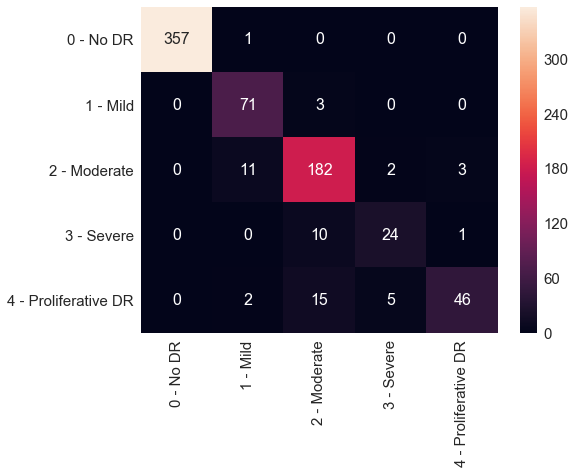

In [ ]:
labels = ['0 - No DR', '1 - Mild', '2 - Moderate', '3 - Severe', '4 - Proliferative DR']
plot_conf_matrix(list(df_train_test['diagnosis'].astype(int)),test_labels,labels)


In [ ]:
cnf_matrix = confusion_matrix(df_train_test['diagnosis'].astype('int'), test_labels)
cnf_matrix_norm = cnf_matrix.astype('float') / cnf_matrix.sum(axis=1)[:, np.newaxis]
df_cm = pd.DataFrame(cnf_matrix_norm, index=labels, columns=labels)
plot.figure(figsize=(16, 7))
sns.heatmap(df_cm, annot=True, fmt='.2f', cmap="Yellows")
plot.show()

ValueError: Colormap Yellows is not recognized. Possible values are: Accent, Accent_r, Blues, Blues_r, BrBG, BrBG_r, BuGn, BuGn_r, BuPu, BuPu_r, CMRmap, CMRmap_r, Dark2, Dark2_r, GnBu, GnBu_r, Greens, Greens_r, Greys, Greys_r, OrRd, OrRd_r, Oranges, Oranges_r, PRGn, PRGn_r, Paired, Paired_r, Pastel1, Pastel1_r, Pastel2, Pastel2_r, PiYG, PiYG_r, PuBu, PuBuGn, PuBuGn_r, PuBu_r, PuOr, PuOr_r, PuRd, PuRd_r, Purples, Purples_r, RdBu, RdBu_r, RdGy, RdGy_r, RdPu, RdPu_r, RdYlBu, RdYlBu_r, RdYlGn, RdYlGn_r, Reds, Reds_r, Set1, Set1_r, Set2, Set2_r, Set3, Set3_r, Spectral, Spectral_r, Wistia, Wistia_r, YlGn, YlGnBu, YlGnBu_r, YlGn_r, YlOrBr, YlOrBr_r, YlOrRd, YlOrRd_r, afmhot, afmhot_r, autumn, autumn_r, binary, binary_r, bone, bone_r, brg, brg_r, bwr, bwr_r, cividis, cividis_r, cool, cool_r, coolwarm, coolwarm_r, copper, copper_r, cubehelix, cubehelix_r, flag, flag_r, gist_earth, gist_earth_r, gist_gray, gist_gray_r, gist_heat, gist_heat_r, gist_ncar, gist_ncar_r, gist_rainbow, gist_rainbow_r, gist_stern, gist_stern_r, gist_yarg, gist_yarg_r, gnuplot, gnuplot2, gnuplot2_r, gnuplot_r, gray, gray_r, hot, hot_r, hsv, hsv_r, icefire, icefire_r, inferno, inferno_r, jet, jet_r, magma, magma_r, mako, mako_r, nipy_spectral, nipy_spectral_r, ocean, ocean_r, pink, pink_r, plasma, plasma_r, prism, prism_r, rainbow, rainbow_r, rocket, rocket_r, seismic, seismic_r, spring, spring_r, summer, summer_r, tab10, tab10_r, tab20, tab20_r, tab20b, tab20b_r, tab20c, tab20c_r, terrain, terrain_r, viridis, viridis_r, vlag, vlag_r, winter, winter_r

<Figure size 1152x504 with 0 Axes>

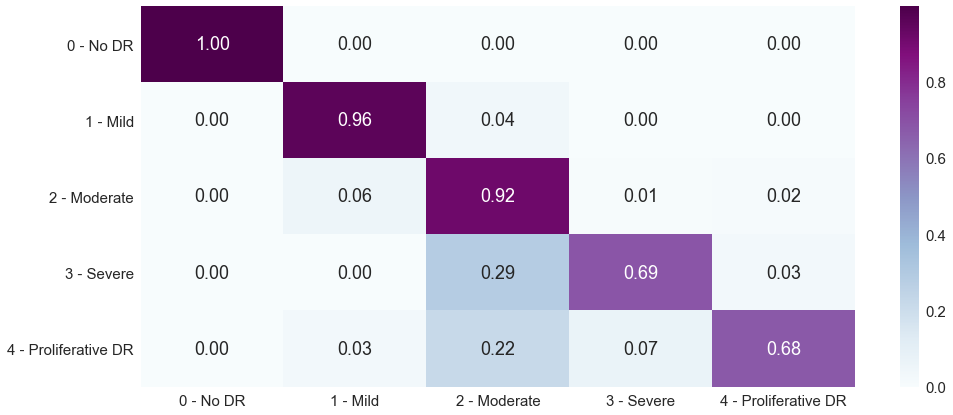

In [ ]:
cnf_matrix = confusion_matrix(df_train_test['diagnosis'].astype('int'), test_labels)
cnf_matrix_norm = cnf_matrix.astype('float') / cnf_matrix.sum(axis=1)[:, np.newaxis]
df_cm = pd.DataFrame(cnf_matrix_norm, index=labels, columns=labels)
plot.figure(figsize=(16, 7))
sns.heatmap(df_cm, annot=True, fmt='.2f', cmap="BuPu")
plot.show()

In [ ]:
def img_generator(train,test):
    train_datagen=ImageDataGenerator(rescale=1./255, validation_split=0.2,horizontal_flip=True)
    
    train_generator=train_datagen.flow_from_dataframe(dataframe=df_train_train,
                                                      directory="C:/Users/Sabarish/Downloads/aptos2019-blindness-detection/train_images_preprocessed",
                                                      x_col="file_name",
                                                      y_col="diagnosis",
                                                      batch_size=BATCH_SIZE,
                                                      class_mode="categorical",
                                                      target_size=(HEIGHT, WIDTH),
                                                      subset='training')
    
    valid_generator=train_datagen.flow_from_dataframe(dataframe=df_train_train,
                                                      directory="C:/Users/Sabarish/Downloads/aptos2019-blindness-detection/train_images_preprocessed",
                                                      x_col="file_name",
                                                      y_col="diagnosis",
                                                      batch_size=BATCH_SIZE,
                                                      class_mode="categorical",    
                                                      target_size=(HEIGHT, WIDTH),
                                                      subset='validation')
    
    test_datagen = ImageDataGenerator(rescale=1./255)
    test_generator1 = test_datagen.flow_from_dataframe(dataframe=df_train_test,
                                                      directory = "C:/Users/Sabarish/Downloads/aptos2019-blindness-detection/train_images_preprocessed",
                                                      x_col="file_name",
                                                      target_size=(HEIGHT, WIDTH),
                                                      batch_size=1,
                                                      shuffle=False,
                                                      class_mode=None,
                                                     validate_filenames=False)
    
    return train_generator,valid_generator,test_generator1

In [ ]:
print("Test Cohen Kappa score: %.3f" % cohen_kappa_score(test_labels, df_train_test['diagnosis'].astype('int'),
                                                         weights='quadratic'))
print("Test Accuracy score : %.3f" % accuracy_score(df_train_test['diagnosis'].astype('int'),test_labels))

Test Cohen Kappa score: 0.949
Test Accuracy score : 0.928


In [ ]:
print("Test Cohen Kappa score: %.3f" % cohen_kappa_score(test_preds, df_train_test['diagnosis'].astype('int'), 
                                                         weights='quadratic'))
print("Test Accuracy score : %.3f" % accuracy_score(df_train_test['diagnosis'].astype('int'),test_preds))
cm = confusion_matrix(df_train_test['diagnosis'].astype('int'),test_preds)
test_recall = np.diag(cm) / np.sum(cm, axis = 1)
test_precision = np.diag(cm) / np.sum(cm, axis = 0)
print('Recall :%.2f' %np.mean(test_recall))
print('Precision : %.2f'%np.mean(test_precision ))
f1score= 2*(test_recall*test_precision)/(test_precision+test_recall)
print('F1 SCORE : %.3f' %np.mean(f1score))




Test Cohen Kappa Score: 0.949
Test Accuracy Score: 0.928
Recall : 0.85
Precision :0.88
F1 SCORE : 0.858


In [ ]:
train_generator,valid_generator,test_generator1 = img_generator(df_train_train,df_train_test)

Found 2344 validated image filenames belonging to 5 classes.
Found 585 validated image filenames belonging to 5 classes.
Found 733 non-validated image filenames.


In [ ]:
def create_model(input_shape, n_out):
    input_tensor = Input(shape=input_shape)
    base_model = applications.ResNet50(weights=None, include_top=False,input_tensor=input_tensor)
    base_model.load_weights('resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5')

    x = GlobalAveragePooling2D()(base_model.output)
    x = Dropout(0.5)(x)
    x = Dense(2048, activation='relu')(x)
    x = Dropout(0.5)(x)
    final_output = Dense(n_out, activation='softmax', name='final_output')(x)
    model = Model(input_tensor, final_output)
    return model

In [ ]:
model = create_model(input_shape=(HEIGHT, WIDTH, CANAL), n_out=N_CLASSES)

for layer in model.layers:
    layer.trainable = False

for i in range(-5, 0):
    model.layers[i].trainable = True
model.summary()

Instructions for updating:
Colocations handled automatically by placer.


C:\Users\Sabarish\Anaconda3\lib\site-packages\keras_applications\resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 320, 320, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 326, 326, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 160, 160, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 160, 160, 64) 256         conv1[0][0]                      
____________________________________________________________________________________________

In [ ]:
from sklearn.model_selection import train_test_split

df_train_train,df_train_test = train_test_split(df_train,test_size = 0.2)
print(df_train_train.shape,df_train_test.shape)

(2929, 4) (733, 4)


In [ ]:
from IPython.display import Image
testImage=Image(filename='0a2b5e1a0be8.png')


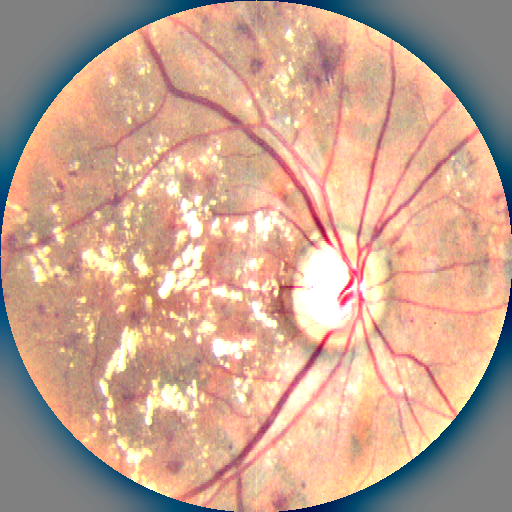

In [ ]:
testImage

In [ ]:
model.predict(testImage)

AttributeError: 'Image' object has no attribute 'ndim'

In [ ]:
test_generator1[1].shape


(1, 320, 320, 3)

In [ ]:
import cv2
import numpy as np
tx=cv2.imread('e25ccfe38e44.png')
size=320
tx=cv2.resize(tx,(size,size))
tx=np.array([tx]).astype('float')
tx /= 255.0


In [ ]:
tx.shape

(1, 320, 320, 3)

In [ ]:
test_generator1[100].shape

(1, 320, 320, 3)

In [ ]:
model.predict(tx)

array([[5.7666111e-01, 3.5523579e-01, 6.7987405e-02, 4.3261621e-06,
        1.1141487e-04]], dtype=float32)

In [ ]:
np.argmax(model.predict(tx))

0

In [ ]:
np.unique(tx1)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [ ]:
test_generator1[1]

array([[[[0.5019608, 0.5019608, 0.5019608],
         [0.5019608, 0.5019608, 0.5019608],
         [0.5019608, 0.5019608, 0.5019608],
         ...,
         [0.5019608, 0.5019608, 0.5019608],
         [0.5019608, 0.5019608, 0.5019608],
         [0.5019608, 0.5019608, 0.5019608]],

        [[0.5019608, 0.5019608, 0.5019608],
         [0.5019608, 0.5019608, 0.5019608],
         [0.5019608, 0.5019608, 0.5019608],
         ...,
         [0.5019608, 0.5019608, 0.5019608],
         [0.5019608, 0.5019608, 0.5019608],
         [0.5019608, 0.5019608, 0.5019608]],

        [[0.5019608, 0.5019608, 0.5019608],
         [0.5019608, 0.5019608, 0.5019608],
         [0.5019608, 0.5019608, 0.5019608],
         ...,
         [0.5019608, 0.5019608, 0.5019608],
         [0.5019608, 0.5019608, 0.5019608],
         [0.5019608, 0.5019608, 0.5019608]],

        ...,

        [[0.5019608, 0.5019608, 0.5019608],
         [0.5019608, 0.5019608, 0.5019608],
         [0.5019608, 0.5019608, 0.5019608],
         ...,


In [ ]:
plot.plot(history_finetunning['loss'])
plot.plot(history_finetunning['val_loss'])
plot.title('Model Loss')
plot.ylabel('Loss')
plot.xlabel('Epoch')
plot.legend(['Train', 'Validation'], loc='lower right')
plot.gca().ticklabel_format(axis='both', style='plain', useOffset=False)
plot.show()

NameError: name 'history_finetunning' is not defined

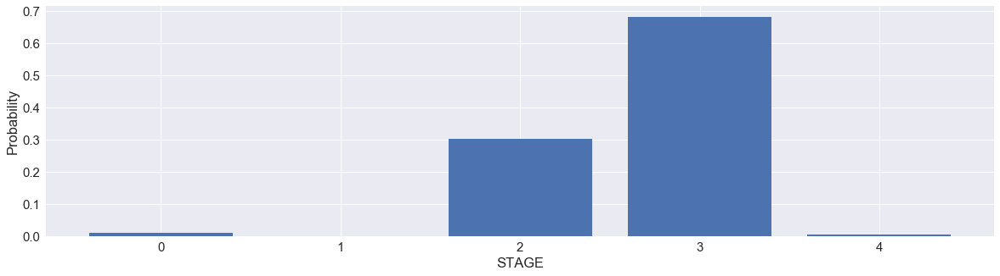

In [ ]:
import cv2
import numpy as np
tx=cv2.imread('0c7e40a82c60.png')
size=320
tx=cv2.resize(tx,(size,size))
tx=np.array([tx]).astype('float')
tx /= 255.0

plot.figure(figsize=(20,5))
x=model.predict(tx)
x=x.flatten()
y=[0,1,2,3,4]
plot.ylabel('PROBABILITY')
plot.xlabel('STAGE')
plot.bar(y,x)
plot.show()  #actual stage is 3

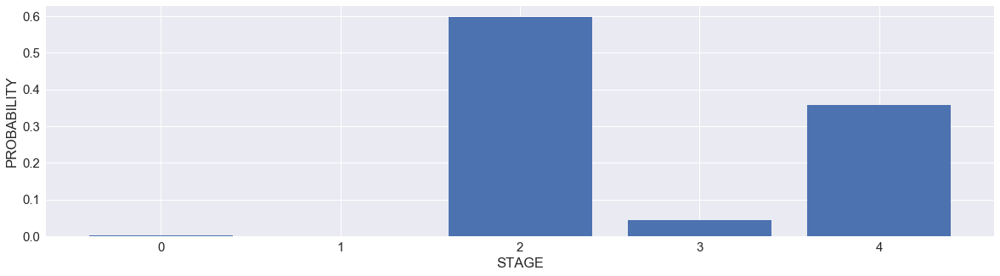

In [ ]:

import cv2
import numpy as np
tx=cv2.imread('1b495ac025b7.png')
size=320
tx=cv2.resize(tx,(size,size))
tx=np.array([tx]).astype('float')
tx /= 255.0

plot.figure(figsize=(20,5))
x=model.predict(tx)
x=x.flatten()
y=[0,1,2,3,4]
plot.ylabel('PROBABILITY')
plot.xlabel('STAGE')
plot.bar(y,x)
plot.show()      #actual stage is 3

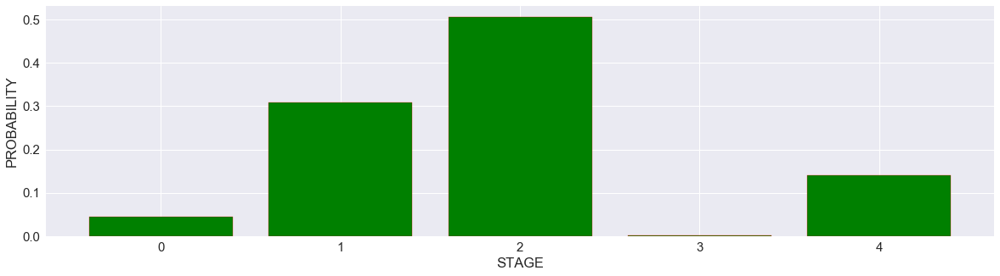

In [ ]:

import cv2
import numpy as np
tx=cv2.imread('1bf30c84bbad.png')
size=320
tx=cv2.resize(tx,(size,size))
tx=np.array([tx]).astype('float')
tx /= 255.0

plot.figure(figsize=(20,5))
x=model.predict(tx)
x=x.flatten()
y=[0,1,2,3,4]
plot.ylabel('PROBABILITY')
plot.xlabel('STAGE')
plot.bar(y,x,color='green', edgecolor = 'red')      #actual stage 4
plot.show() 

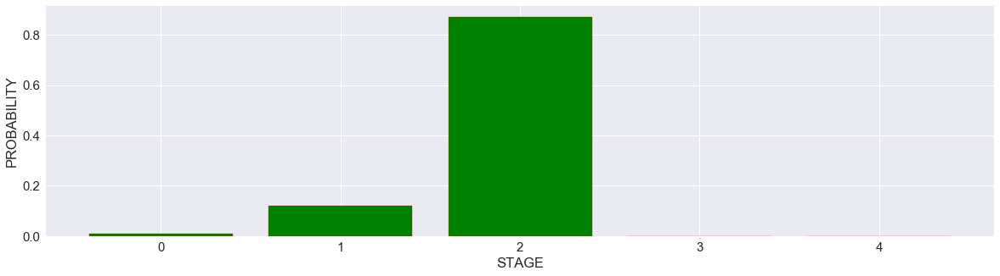

In [ ]:

import cv2
import numpy as np
tx=cv2.imread('1c5e6cdc7ee1.png')
size=320
tx=cv2.resize(tx,(size,size))
tx=np.array([tx]).astype('float')
tx /= 255.0

plot.figure(figsize=(20,5))
x=model.predict(tx)
x=x.flatten()
y=[0,1,2,3,4]
plot.ylabel('PROBABILITY')
plot.xlabel('STAGE')
plot.bar(y,x,color='green', edgecolor = 'red')      #actual stage 2
plot.show() 